In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

import gc
import warnings
import os
import time

from contextlib import contextmanager
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold

#warnings.simplefilter(action='ignore', category=FutureWarning)

# print the list of data csv files we have downloaded
print(os.listdir("../Projet+Mise+en+prod+-+home-credit-default-risk"))


['application_test.csv', '.DS_Store', 'HomeCredit_columns_description.csv', 'POS_CASH_balance.csv', 'credit_card_balance.csv', 'installments_payments.csv', 'application_train.csv', 'bureau.csv', 'previous_application.csv', 'bureau_balance.csv', 'sample_submission.csv']


In [2]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns.sort_values('% of Total Values', 
                                                                          ascending=False).round(1)
          #  mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
       # '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns[mis_val_table_ren_columns.iloc[:,1] != 0].shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [3]:
# read the df obtained from merging the csv files in projet7_kaggle_file.ipynb
main_model_df = pd.read_csv("../my_csv_files/MY_merged_train.csv")

# read the df obtained from the feature selection in projet7_models_finding_features.ipynb
combined_feats_for_models = pd.read_csv("../my_csv_files/feats_import_combined_lgbm128_mssing.csv")


In [5]:
combined_feats_for_models.columns = ['index', 'ft_names']
combined_feats_for_models

,index,ft_names
0,0,INSTAL_DPD_MEAN
1,1,AMT_GOODS_PRICE
2,2,EXT_SOURCE_2
3,3,ACTIVE_AMT_CREDIT_SUM_MAX
4,4,ACTIVE_AMT_CREDIT_SUM_MEAN
...,...,...
79,79,INSTAL_PAYMENT_PERC_SUM
80,80,INSTAL_DBD_MAX
81,81,CLOSED_DAYS_CREDIT_MIN
82,82,PREV_NAME_CONTRACT_STATUS_Refused_MEAN


In [6]:
# add all features I have selected along with 'TARGET', 'SK_ID_CURR', 'index'
ft_names = list(combined_feats_for_models["ft_names"])
total_names  = ft_names + ['TARGET', 'SK_ID_CURR', 'index']

In [7]:
len(ft_names)

84

In [9]:
len(total_names)

87

In [10]:
ft_selec_main_model = main_model_df[total_names]
ft_selec_main_model.to_csv("../my_csv_files/ft_selec_main_model.csv")

In [11]:
print(main_model_df.shape)
print(ft_selec_main_model.shape)

(307507, 799)
(307507, 87)


In [12]:
# read in the main model with selected features
#ft_selec_main_model = pd.read_csv("../my_csv_files/ft_selec_main_model.csv")
ft_selec_main_model

,INSTAL_DPD_MEAN,AMT_GOODS_PRICE,EXT_SOURCE_2,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_CREDIT_TYPE_Microloan_MEAN,PREV_NAME_YIELD_GROUP_high_MEAN,ACTIVE_DAYS_CREDIT_MAX,REGION_RATING_CLIENT_W_CITY,...,INSTAL_DBD_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_PAYMENT_PERC_SUM,INSTAL_DBD_MAX,CLOSED_DAYS_CREDIT_MIN,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,TARGET,SK_ID_CURR,index
0,0.000000,351000.0,0.262949,450000.0,2.409943e+05,245781.00,0.0,0.000000,-103.0,2,...,20.421053,219625.695,19.000000,31.0,-1437.0,0.000000,0.000000,1.0,100002,0
1,0.000000,1129500.0,0.622246,810000.0,8.100000e+05,0.00,0.0,0.000000,-606.0,1,...,7.160000,1618864.650,25.000000,14.0,-2586.0,0.000000,0.000000,0.0,100003,1
2,0.000000,135000.0,0.555912,NaN,NaN,0.00,0.0,0.000000,NaN,2,...,7.666667,21288.465,3.000000,11.0,-1326.0,0.000000,0.000000,0.0,100004,2
3,0.000000,297000.0,0.650442,NaN,NaN,NaN,NaN,0.222222,NaN,2,...,19.375000,1007153.415,16.000000,77.0,NaN,0.111111,0.111111,0.0,100006,3
4,0.954545,513000.0,0.322738,NaN,NaN,0.00,0.0,0.500000,NaN,2,...,4.590909,835985.340,63.000000,31.0,-1149.0,0.000000,0.000000,0.0,100007,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307502,0.000000,225000.0,0.681632,NaN,NaN,NaN,NaN,1.000000,NaN,1,...,36.285714,52450.470,7.000000,46.0,NaN,0.000000,0.000000,0.0,456251,307506
307503,0.500000,225000.0,0.115992,NaN,NaN,NaN,NaN,0.000000,NaN,2,...,3.333333,60419.205,6.000000,11.0,NaN,0.000000,0.000000,0.0,456252,307507
307504,0.642857,585000.0,0.535722,2250000.0,1.305000e+06,1795833.00,0.0,1.000000,-713.0,3,...,15.142857,61595.910,13.000000,51.0,-919.0,0.000000,0.000000,0.0,456253,307508
307505,0.000000,319500.0,0.514163,NaN,NaN,0.00,0.0,0.500000,NaN,2,...,19.000000,194556.825,19.000000,31.0,-1104.0,0.000000,0.000000,1.0,456254,307509


In [13]:
#del main_model_df
gc.collect()

169

In [14]:
# Missing values statistics
missing_values = missing_values_table(ft_selec_main_model)
missing_values.to_csv("../my_csv_files/ft_selec_missing_values.csv")
missing_values.head(20)

Your selected dataframe has 87 columns.
There are 71 columns that have missing values.


,Missing Values,% of Total Values
ACTIVE_AMT_CREDIT_SUM_MAX,90362,29.4
ACTIVE_AMT_CREDIT_SUM_MEAN,90362,29.4
ACTIVE_DAYS_CREDIT_UPDATE_MEAN,90361,29.4
ACTIVE_DAYS_CREDIT_MEAN,90361,29.4
ACTIVE_DAYS_CREDIT_MAX,90361,29.4
ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,90361,29.4
CLOSED_AMT_CREDIT_SUM_MAX,77346,25.2
CLOSED_DAYS_CREDIT_MAX,77346,25.2
CLOSED_DAYS_CREDIT_MIN,77346,25.2
EXT_SOURCE_3,60965,19.8


In [15]:
missing_values.tail(40)

,Missing Values,% of Total Values
PREV_NAME_YIELD_GROUP_high_MEAN,16454,5.4
PREV_NAME_CONTRACT_STATUS_Refused_MEAN,16454,5.4
PREV_DAYS_DECISION_MEAN,16454,5.4
PREV_NAME_CASH_LOAN_PURPOSE_Repairs_MEAN,16454,5.4
PREV_CODE_REJECT_REASON_LIMIT_MEAN,16454,5.4
PREV_DAYS_DECISION_MIN,16454,5.4
PREV_AMT_CREDIT_MAX,16454,5.4
INSTAL_PAYMENT_PERC_MEAN,15894,5.2
INSTAL_PAYMENT_PERC_SUM,15886,5.2
INSTAL_DAYS_ENTRY_PAYMENT_MEAN,15876,5.2


In [17]:
type(ft_selec_main_model['SK_ID_CURR'][0])

numpy.int64

# Missing Values

In [16]:
ft_selec_main_model.columns

Index(['INSTAL_DPD_MEAN', 'AMT_GOODS_PRICE', 'EXT_SOURCE_2',
       'ACTIVE_AMT_CREDIT_SUM_MAX', 'ACTIVE_AMT_CREDIT_SUM_MEAN',
       'BURO_AMT_CREDIT_SUM_DEBT_SUM', 'BURO_CREDIT_TYPE_Microloan_MEAN',
       'PREV_NAME_YIELD_GROUP_high_MEAN', 'ACTIVE_DAYS_CREDIT_MAX',
       'REGION_RATING_CLIENT_W_CITY', 'APPROVED_AMT_APPLICATION_MAX',
       'PREV_DAYS_DECISION_MEAN', 'AMT_ANNUITY', 'EXT_SOURCE_3',
       'PREV_AMT_ANNUITY_MAX', 'PREV_AMT_ANNUITY_MEAN',
       'PREV_NAME_TYPE_SUITE_nan_MEAN', 'INSTAL_AMT_INSTALMENT_MAX',
       'BURO_AMT_CREDIT_SUM_DEBT_MEAN', 'PREV_APP_CREDIT_PERC_MIN',
       'INSTAL_DAYS_ENTRY_PAYMENT_MAX', 'INSTAL_AMT_PAYMENT_SUM',
       'INSTAL_DBD_SUM', 'ACTIVE_AMT_CREDIT_SUM_DEBT_SUM', 'DAYS_EMPLOYED',
       'INSTAL_PAYMENT_DIFF_SUM', 'FLAG_DOCUMENT_18', 'INSTAL_COUNT',
       'APPROVED_CNT_PAYMENT_MEAN', 'PREV_APP_CREDIT_PERC_MAX',
       'INSTAL_DAYS_ENTRY_PAYMENT_SUM', 'INSTAL_PAYMENT_PERC_MEAN',
       'NAME_FAMILY_STATUS_Married', 'FLAG_DOCUMENT_3',
   

In [18]:
df = ft_selec_main_model[ft_selec_main_model['TARGET'].notnull()]
#test_df = main_model_df[main_model_df['TARGET'].isnull()]
# Missing values statistics
missing_values = missing_values_table(df)
#missing_values.to_csv("../my_csv_files/ft_selec_missing_values.csv")
missing_values.tail(35)

Your selected dataframe has 87 columns.
There are 71 columns that have missing values.


,Missing Values,% of Total Values
PREV_DAYS_DECISION_MIN,16454,5.4
PREV_AMT_CREDIT_MAX,16454,5.4
INSTAL_PAYMENT_PERC_MEAN,15894,5.2
INSTAL_PAYMENT_PERC_SUM,15886,5.2
INSTAL_DAYS_ENTRY_PAYMENT_MEAN,15876,5.2
INSTAL_DAYS_ENTRY_PAYMENT_MAX,15876,5.2
INSTAL_DBD_MAX,15868,5.2
INSTAL_AMT_INSTALMENT_SUM,15868,5.2
INSTAL_DBD_MEAN,15868,5.2
INSTAL_DPD_MEAN,15868,5.2


In [19]:
df = df[df['ANNUITY_INCOME_PERC'].notnull()]
df = df[df['AMT_ANNUITY'].notnull()]
df = df[df['PAYMENT_RATE'].notnull()]

df = df[df['AMT_GOODS_PRICE'].notnull()]
df = df[df['EXT_SOURCE_2'].notnull()]
df = df[df['DEF_30_CNT_SOCIAL_CIRCLE'].notnull()]

In [59]:
missing_values_table(df).head(35)

Your selected dataframe has 87 columns.
There are 68 columns that have missing values.


,Missing Values,% of Total Values
ACTIVE_AMT_CREDIT_SUM_MAX,89611,29.3
ACTIVE_AMT_CREDIT_SUM_MEAN,89611,29.3
ACTIVE_DAYS_CREDIT_UPDATE_MEAN,89610,29.3
ACTIVE_DAYS_CREDIT_MEAN,89610,29.3
ACTIVE_DAYS_CREDIT_MAX,89610,29.3
ACTIVE_AMT_CREDIT_SUM_DEBT_SUM,89610,29.3
CLOSED_AMT_CREDIT_SUM_MAX,76717,25.1
CLOSED_DAYS_CREDIT_MAX,76717,25.1
CLOSED_DAYS_CREDIT_MIN,76717,25.1
EXT_SOURCE_3,60397,19.8


In [25]:
df.shape

(305541, 35)

## Missing values: Version for Undersampling

In [22]:
#df_ft_selec_dropna = df.dropna()
df_ft_selec_dropna = df
df_ft_selec_dropna.shape

(305541, 87)

In [27]:
df_ft_selec_dropinf = df[~df.isin([np.inf, -np.inf]).any(1)]

In [30]:
df_ft_selec_dropinf

,INSTAL_DPD_MEAN,AMT_GOODS_PRICE,EXT_SOURCE_2,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_CREDIT_TYPE_Microloan_MEAN,PREV_NAME_YIELD_GROUP_high_MEAN,ACTIVE_DAYS_CREDIT_MAX,REGION_RATING_CLIENT_W_CITY,...,INSTAL_DBD_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_PAYMENT_PERC_SUM,INSTAL_DBD_MAX,CLOSED_DAYS_CREDIT_MIN,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,TARGET,SK_ID_CURR,index
0,0.000000,351000.0,0.262949,450000.0,2.409943e+05,245781.00,0.0,0.000000,-103.0,2,...,20.421053,219625.695,19.000000,31.0,-1437.0,0.000000,0.000000,1.0,100002,0
1,0.000000,1129500.0,0.622246,810000.0,8.100000e+05,0.00,0.0,0.000000,-606.0,1,...,7.160000,1618864.650,25.000000,14.0,-2586.0,0.000000,0.000000,0.0,100003,1
2,0.000000,135000.0,0.555912,NaN,NaN,0.00,0.0,0.000000,NaN,2,...,7.666667,21288.465,3.000000,11.0,-1326.0,0.000000,0.000000,0.0,100004,2
3,0.000000,297000.0,0.650442,NaN,NaN,NaN,NaN,0.222222,NaN,2,...,19.375000,1007153.415,16.000000,77.0,NaN,0.111111,0.111111,0.0,100006,3
4,0.954545,513000.0,0.322738,NaN,NaN,0.00,0.0,0.500000,NaN,2,...,4.590909,835985.340,63.000000,31.0,-1149.0,0.000000,0.000000,0.0,100007,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307502,0.000000,225000.0,0.681632,NaN,NaN,NaN,NaN,1.000000,NaN,1,...,36.285714,52450.470,7.000000,46.0,NaN,0.000000,0.000000,0.0,456251,307506
307503,0.500000,225000.0,0.115992,NaN,NaN,NaN,NaN,0.000000,NaN,2,...,3.333333,60419.205,6.000000,11.0,NaN,0.000000,0.000000,0.0,456252,307507
307504,0.642857,585000.0,0.535722,2250000.0,1.305000e+06,1795833.00,0.0,1.000000,-713.0,3,...,15.142857,61595.910,13.000000,51.0,-919.0,0.000000,0.000000,0.0,456253,307508
307505,0.000000,319500.0,0.514163,NaN,NaN,0.00,0.0,0.500000,NaN,2,...,19.000000,194556.825,19.000000,31.0,-1104.0,0.000000,0.000000,1.0,456254,307509


In [ ]:
#df_ft_selec_dropna = df[~df.isin([np.nan, np.inf, -np.inf]).any(1)]
#df_ft_selec_dropna = df[~df.isin([np.inf, -np.inf]).any(1)]
#df_ft_selec_dropna.shape
df_ft_selec_dropinf

In [31]:
df_ft_selec_dropinf["TARGET"].value_counts()

0.0    280824
1.0     24716
Name: TARGET, dtype: int64

In [32]:
sum(df_ft_selec_dropna["TARGET"] == 1.0)

11231

In [33]:
sum(df_ft_selec_dropinf["TARGET"] == 1.0)

24716

In [37]:
np.random.choice(df_ft_selec_dropinf.TARGET[df_ft_selec_dropinf["TARGET"] == 0.0],
                 40000, replace=False)

array([0., 0., 0., ..., 0., 0., 0.])

In [38]:
# sample_size = sum(df_ft_selec_dropna["TARGET"] == 1.0)  # Equivalent to len(data[data.Healthy == 0])

random_indices = np.random.choice(list(df_ft_selec_dropinf.TARGET[df_ft_selec_dropinf["TARGET"] == 0.0].index),
                 25000, replace=False)

In [34]:
len(random_indices)

24000

In [35]:
23649*2

47298

In [36]:
#list(random_indices)

In [39]:
df_ft_selec_underbal = pd.concat([df_ft_selec_dropinf.loc[list(random_indices)], 
                                  df_ft_selec_dropinf[df_ft_selec_dropinf["TARGET"] == 1.0]])

In [40]:
df_ft_selec_underbal

,INSTAL_DPD_MEAN,AMT_GOODS_PRICE,EXT_SOURCE_2,ACTIVE_AMT_CREDIT_SUM_MAX,ACTIVE_AMT_CREDIT_SUM_MEAN,BURO_AMT_CREDIT_SUM_DEBT_SUM,BURO_CREDIT_TYPE_Microloan_MEAN,PREV_NAME_YIELD_GROUP_high_MEAN,ACTIVE_DAYS_CREDIT_MAX,REGION_RATING_CLIENT_W_CITY,...,INSTAL_DBD_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_PAYMENT_PERC_SUM,INSTAL_DBD_MAX,CLOSED_DAYS_CREDIT_MIN,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,PREV_NAME_PORTFOLIO_Cards_MEAN,TARGET,SK_ID_CURR,index
159225,0.000000,1174500.0,0.649203,NaN,NaN,0.000,0.0,0.500000,NaN,2,...,9.988889,718561.035,90.0,30.0,-2695.0,0.000000,0.000000,0.0,284593,159228
79227,0.000000,238500.0,0.584526,NaN,NaN,NaN,NaN,0.000000,NaN,2,...,19.444444,39548.115,9.0,28.0,NaN,0.000000,0.000000,0.0,191844,79229
295252,0.000000,234000.0,0.707199,450000.000,225000.000,616410.000,0.0,0.333333,-65.0,2,...,29.090909,357527.160,33.0,108.0,-2171.0,0.000000,0.000000,0.0,442070,295256
264218,0.000000,450000.0,0.346476,855000.000,465276.375,1641132.000,0.0,0.000000,-167.0,3,...,16.750000,35494.380,4.0,29.0,-2857.0,0.000000,0.000000,0.0,405973,264222
122732,NaN,1206000.0,0.485732,NaN,NaN,0.000,0.0,NaN,NaN,2,...,NaN,NaN,NaN,NaN,-2482.0,NaN,NaN,0.0,242300,122735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307444,0.000000,450000.0,0.329708,5850000.000,1785864.375,4728279.015,0.0,0.166667,-227.0,3,...,4.000000,302244.075,20.0,21.0,-1806.0,0.000000,0.166667,1.0,456186,307448
307471,0.172589,1125000.0,0.583214,2025000.000,987127.875,747031.500,0.0,0.272727,-170.0,2,...,3.482234,3868221.060,193.0,38.0,-2624.0,0.181818,0.000000,1.0,456215,307475
307477,6.522843,297000.0,0.713524,872064.000,517032.000,2797449.840,0.0,0.200000,-354.0,2,...,4.827411,2168538.255,174.0,38.0,-1813.0,0.600000,0.200000,1.0,456225,307481
307485,0.035714,450000.0,0.615261,282663.315,282663.315,223943.895,0.0,0.000000,-203.0,2,...,14.607143,167287.365,28.0,59.0,NaN,0.000000,0.500000,1.0,456233,307489


In [39]:
df_ft_selec_underbal.shape

(47340, 35)

In [40]:
df_ft_selec_underbal.to_csv("../my_csv_files/df_ft_selec_underbal.csv")

## Missing values: Version for Oversampling (SMOTE)

In [71]:
# PREV_APP_CREDIT_PERC_MEAN  INSTAL_PAYMENT_PERC_MEAN INSTAL_PAYMENT_PERC_SUM
df_feat_selec_smote = df[~df.isin([np.inf, -np.inf]).any(1)]

In [74]:
df_feat_selec_smote = df_feat_selec_smote.fillna(df_feat_selec_smote.mean()

In [ ]:
print(df_feat_selec_smote.shape)

In [75]:
missing_values_smote = missing_values_table(df_feat_selec_smote)
missing_values_smote.head(55)

Your selected dataframe has 55 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values
INSTAL_AMT_INSTALMENT_MAX,0,0.0
AMT_INCOME_TOTAL,0,0.0
INSTAL_PAYMENT_DIFF_MAX,0,0.0
DAYS_LAST_PHONE_CHANGE,0,0.0
INSTAL_DBD_MAX,0,0.0
INSTAL_DBD_SUM,0,0.0
INSTAL_AMT_INSTALMENT_SUM,0,0.0
PREV_DAYS_DECISION_MAX,0,0.0
PREV_AMT_ANNUITY_MIN,0,0.0
PREV_AMT_ANNUITY_MEAN,0,0.0


In [76]:
import re

# Divide in training/validation and test data
df_feat_selec_smote = df_feat_selec_smote.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

train_df = df_feat_selec_smote[df_feat_selec_smote['TARGET'].notnull()]
test_df = df_feat_selec_smote[df_feat_selec_smote['TARGET'].isnull()]


# Cross validation model
#if stratified:
#    folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
#else:
#    folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    
# Create arrays and dataframes to store results
feats = [f for f in train_df.columns if f not in ['TARGET', 'Unnamed: 0', 'Unnamed0',
                                                  'SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]

# Sklearn stuff
#from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

# Load and split dataset
#x_train, x_test, y_train, y_test = train_test_split(train_df[feats], train_df['TARGET'], 
 #                                                   test_size=0.3, random_state = 22)




In [80]:
len(train_df['TARGET'])

307488

In [81]:
train_df['TARGET'].value_counts()

0.0    282665
1.0     24823
Name: TARGET, dtype: int64

In [79]:
train_df[feats].shape

(307488, 52)

In [82]:
from imblearn.over_sampling import SMOTE 

sm = SMOTE(random_state = 24)

X_sm, y_sm = sm.fit_resample(train_df[feats], train_df['TARGET'])

print(f'''Shape of X before SMOTE: {train_df[feats].shape}
Shape of X after SMOTE: {X_sm.shape}''')

print('\nBalance of positive and negative classes (%):')
y_sm.value_counts(normalize=True) * 100

Shape of X before SMOTE: (307488, 52)
Shape of X after SMOTE: (565330, 52)

Balance of positive and negative classes (%):


1.0    50.0
0.0    50.0
Name: TARGET, dtype: float64

In [88]:
x_train, x_test, y_train, y_test = train_test_split(X_sm, y_sm, 
                                                    test_size=0.3, random_state = 22)

In [94]:
# concat the smote version back together for later models
X_sm.shape

(565330, 52)

In [95]:
len(y_sm)

565330

In [101]:
df_smote_version = pd.concat([X_sm, y_sm], axis = 1)

# Modelling Start

## Create my own cost function and divide into test / train

In [41]:
import re

df_ft_selec = df_ft_selec_underbal
# Divide in training/validation and test data
df_ft_selec = df_ft_selec.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

train_df = df_ft_selec[df_ft_selec['TARGET'].notnull()]
test_df = df_ft_selec[df_ft_selec['TARGET'].isnull()]


# Cross validation model
#if stratified:
#    folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
#else:
#    folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    
# Create arrays and dataframes to store results
feats = [f for f in train_df.columns if f not in ['TARGET', 'Unnamed: 0', 'Unnamed0',
                                                  'SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV',
                                                  'index']]

# Sklearn stuff
from sklearn.model_selection import train_test_split

# Load and split dataset
x_train, x_test, y_train, y_test = train_test_split(train_df[feats], train_df['TARGET'], 
                                                    test_size=0.3, random_state = 22)

In [42]:
del test_df
gc.collect()

39

## Hyperparameter Search: from hyperopt

In [43]:
from sklearn.metrics import confusion_matrix
import numpy as np

def my_comp_score(y_true, y_pred):

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    tn_weight = 1
    fp_weight = 0
    fn_weight = -10
    tp_weight = 0

    # gain function for company, true positives and false positives don't matter that much to us
    # we want to penalise the false negatives, and we want to say yes to true negatives
    gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)
    
    # best represents scenario where there are no false negatives or false postives
    # so all false positives would be correctly shown as negative
    # and all false negatives would be correctly show as positive
    best = (tn + fp) * tn_weight + (tp + fn) * tp_weight
    
    # baseline is a naive model that predicts non default(negative) for everyone
    # but all true positives and false negatives would be incorrectly shown as negative
    baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight
    
    score = (gain - baseline) / (best - baseline)
    
    return score



def my_comp_score_probs(y_true, y_pred):
    
    # for now y_pred is the probability that the value is 1
    y_use = [1 if i >= 0.5 else 0 for i in y_pred]
    
    y_use = pd.Series(y_use)

    tn, fp, fn, tp = confusion_matrix(y_true, y_use).ravel()
    
    tn_weight = 1
    fp_weight = 0
    fn_weight = -10
    tp_weight = 0

    # gain function for company, true positives and false positives don't matter that much to us
    # we want to penalise the false negatives, and we want to say yes to true negatives
    gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)
    
    # best represents scenario where there are no false negatives or false postives
    # so all false positives would be correctly shown as negative
    # and all false negatives would be correctly show as positive
    best = (tn + fp) * tn_weight + (tp + fn) * tp_weight
    
    # baseline is a naive model that predicts non default(negative) for everyone
    # so all true positives and false negatives would be incorrectly shown as negative
    baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight
    
    score = ((gain - baseline) / (best - baseline))

    return score

In [44]:
from sklearn.metrics import fbeta_score, make_scorer
#make_scorer(my_comp_score)

In [45]:
from hyperopt import fmin, tpe, hp, anneal, Trials

# HyperOpt: Optimizer
from hyperopt import tpe

kf = KFold(n_splits = 5)

In [46]:
# make sure we have the right dataset


In [47]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

def gb_mse_cv(params, random_state = 22, cv = kf, X = x_train, y= y_train):
    # the function gets a set of variable parameters in "param"
    params = {'learning_rate': params['learning_rate'],
              'num_leaves': int(params['num_leaves']),
              'subsample' : params['subsample'],
              'max_depth': int(params['max_depth']),
              'reg_alpha' : params['reg_alpha'],
              'reg_lambda' : params['reg_lambda'],
              'min_child_weight': int(params['min_child_weight']),
              'min_data_in_leaf': int(params['min_data_in_leaf']),
              'min_split_gain' :  params['min_split_gain']
              }
    #              'min_data_in_leaf': int(params['min_data_in_leaf']),
    
    # we use this params to create a new LGBM Regressor
    model = LGBMClassifier(random_state = random_state, **params)
    
    # and then conduct the cross validation with the same folds as before
    score = -cross_val_score(model, X, y, cv=cv, 
                             scoring= make_scorer(my_comp_score_probs, 
                                                                      needs_proba= True), 
                             n_jobs=-1).mean()

    return score


In [48]:
%%time

n_iter = 50

# possible values of parameters
space = {'learning_rate': hp.loguniform('learning_rate', -5, 0),
         'num_leaves' : hp.quniform('num_leaves', 2, 40, 1),
         'subsample' : hp.loguniform('subsample', -4, 0),
         'max_depth' : hp.quniform('max_depth', 2, 14, 1),
         'reg_alpha' : hp.loguniform('reg_alpha', -4, 0),
         'reg_lambda' : hp.loguniform('reg_lambda', -4, 0),
         'min_child_weight': hp.quniform('min_child_weight', 2, 40, 1),
         'min_data_in_leaf': hp.quniform('min_data_in_leaf', 2, 40, 1),
         'min_split_gain' : hp.loguniform('min_split_gain', -4, 0)
        }

# trials will contain logging information
trials = Trials()

best=fmin(fn=gb_mse_cv, # function to optimize
          space=space, 
          algo=tpe.suggest, # optimization algorithm, hyperotp will select its parameters automatically
          max_evals=n_iter, # maximum number of iterations
          trials=trials, # logging
          rstate=np.random.RandomState(58) # fixing random state for the reproducibility
         )

# computing the score on the test set
model = LGBMClassifier(random_state = 54,
                       learning_rate = best['learning_rate'],
                       num_leaves = int(best['num_leaves']), 
                       subsample = best['subsample'],
                       max_depth = int(best['max_depth']),
                       reg_alpha = best['reg_alpha'],
                       reg_lambda = best['reg_lambda'],
                       min_child_weight = int(best['min_child_weight']),
                       min_data_in_leaf = int(best['min_data_in_leaf']),
                       min_split_gain = best['min_split_gain']
                       )

model.fit(x_train, y_train)

print("Best  {:.3f} params {}".format( gb_mse_cv(best), best))


100%|██████████| 50/50 [01:59<00:00,  2.39s/trial, best loss: -0.6646017244870801]
[LightGBM] [Warning] min_data_in_leaf is set=16, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=16
Best  -0.665 params {'learning_rate': 0.12406563722973285, 'max_depth': 8.0, 'min_child_weight': 21.0, 'min_data_in_leaf': 16.0, 'min_split_gain': 0.10758484903193334, 'num_leaves': 29.0, 'reg_alpha': 0.8267847013350155, 'reg_lambda': 0.2632332988417265, 'subsample': 0.35048202158006775}
CPU times: user 7.79 s, sys: 1.89 s, total: 9.67 s
Wall time: 2min 3s


In [49]:
print("Best  {:.3f} params {}".format( gb_mse_cv(best), best))

Best  -0.665 params {'learning_rate': 0.12406563722973285, 'max_depth': 8.0, 'min_child_weight': 21.0, 'min_data_in_leaf': 16.0, 'min_split_gain': 0.10758484903193334, 'num_leaves': 29.0, 'reg_alpha': 0.8267847013350155, 'reg_lambda': 0.2632332988417265, 'subsample': 0.35048202158006775}


array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>], dtype=object)

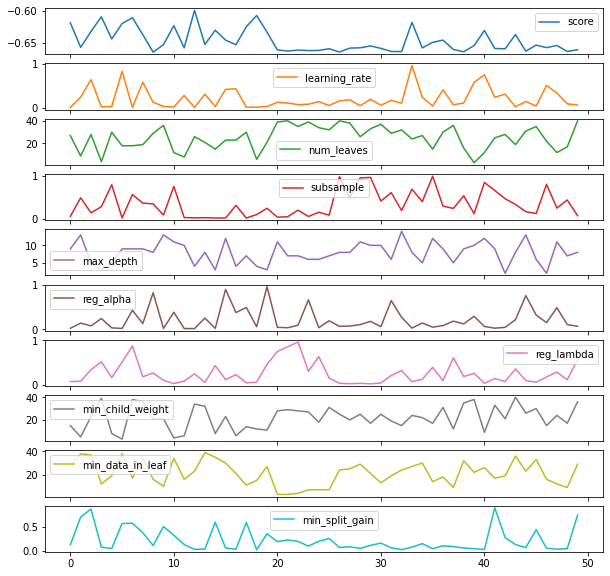

In [50]:
#tpe_test_score=mean_squared_error(x_test, model.predict(y_test))

tpe_results = np.array([[x['result']['loss'],
                         x['misc']['vals']['learning_rate'][0],
                         x['misc']['vals']['num_leaves'][0],
                         x['misc']['vals']['subsample'][0],
                         x['misc']['vals']['max_depth'][0],
                         x['misc']['vals']['reg_alpha'][0],
                         x['misc']['vals']['reg_lambda'][0],
                         x['misc']['vals']['min_child_weight'][0],
                         x['misc']['vals']['min_data_in_leaf'][0],
                         x['misc']['vals']['min_split_gain'][0]] for x in trials.trials])

tpe_results_df = pd.DataFrame(tpe_results,
                           columns=['score', 
                                    'learning_rate', 
                                    'num_leaves',
                                    'subsample',
                                    'max_depth',
                                    'reg_alpha',
                                    'reg_lambda',
                                    'min_child_weight',
                                    'min_data_in_leaf',
                                    'min_split_gain'])
                                    
tpe_results_df.plot(subplots=True,figsize=(10, 10))

In [ ]:
model

In [31]:
import pickle
import joblib

#+ "/classification/models/"
#model, vectorizer_model = train_test_model(data["text"], data["category"])
joblib.dump(model, "../Models/hyperpar_search_lgbm_thresh03model.sav")
#joblib.dump(vectorizer_model, model_path+"vectorizer.sav")
print ("====done saving into pickle using Joblib!====")

pickle.dump(model, open("../Models/hyperpar_search_lgbm_thresh03model.pickle", 'wb'))
#pickle.dump(vectorizer_model, open(model_path+"vectorizer.pickle", "wb"))
print ("====done saving into pickle using Pickle!====")

====done saving into pickle using Joblib!====
====done saving into pickle using Pickle!====


In [ ]:
def loading_pickle(model_path):
    #vectorizer = pickle.load(open(model_path+"vectorizer.pickle",'rb'))
    model = pickle.load(open(model_path+"model.pickle",'rb'))
    return model
    #return vectorizer, model


def loading_joblibPickle(model_path):
    #vectorizer = joblib.load(model_path+"vectorizer.sav")
    model = joblib.load(model_path+"model.sav")
    return model 
    #return vectorizer, model

In [ ]:
loading_pickle(model_path)

## Launching the model

In [51]:
from sklearn.metrics import confusion_matrix
import numpy as np

def my_comp_score_lgbm(y_true, y_pred):
    
    # for now y_pred is the probability that the value is 1
    y_use = [1 if i >= 0.5 else 0 for i in y_pred]
    
    y_use = pd.Series(y_use)

    tn, fp, fn, tp = confusion_matrix(y_true, y_use).ravel()
    
    tn_weight = 1
    fp_weight = 0
    fn_weight = -10
    tp_weight = 0

    # gain function for company, true positives and false positives don't matter that much to us
    # we want to penalise the false negatives, and we want to say yes to true negatives
    gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)
    
    # best represents scenario where there are no false negatives or false postives
    # so all false positives would be correctly shown as negative
    # and all false negatives would be correctly show as positive
    best = (tn + fp) * tn_weight + (tp + fn) * tp_weight
    
    # baseline is a naive model that predicts non default(negative) for everyone
    # but all true positives and false negatives would be incorrectly shown as negative
    baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight
    
    score = ((gain - baseline) / (best - baseline))

    return 'my score', score, True

In [52]:
# Display/plot feature importance
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('../lgbm_importances02.png')

In [53]:
#main_model_df


In [54]:
import re

num_folds= 10
stratified= False
#debug= debug

df_lgbm = df_ft_selec_underbal

# Divide in training/validation and test data
df_lgbm = df_lgbm.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

train_df = df_lgbm[df_lgbm['TARGET'].notnull()]
test_df = df_lgbm[df_lgbm['TARGET'].isnull()]

#print("Starting LightGBM. Train shape: {}, test shape: {}".format(trainlgbm_df.shape, 
#                                                                  testlgbm_df.shape))
#del main_model_df
#gc.collect()

# Cross validation model
if stratified:
    folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
else:
    folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    
# Create arrays and dataframes to store results
oof_preds = np.zeros(train_df.shape[0])
#sub_preds = np.zeros(test_df.shape[0])
feature_importance_df = pd.DataFrame()

# Create arrays and dataframes to store results
feats = [f for f in train_df.columns if f not in ['TARGET', 'Unnamed: 0', 'Unnamed0',
                                                  'SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]


In [55]:
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], 
                                                            train_df['TARGET'])):
    train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
    valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]
    
    train_x.to_csv("../my_csv_files/MY_train_x.csv")
    valid_x.to_csv("../my_csv_files/MY_valid_x.csv")
    valid_y.to_csv("../my_csv_files/MY_valid_y.csv")

    ##LightGBM parameters found by Bayesian optimization, Kaggle version
    #clf = LGBMClassifier(
    #    nthread=4,
    #    n_estimators=10000,
    #    learning_rate=0.02,
    #    num_leaves=34,
    #    colsample_bytree=0.9497036,
    #    subsample=0.8715623,
    #    max_depth=8,
    #    reg_alpha=0.041545473,
    #    reg_lambda=0.0735294,
    #    min_split_gain=0.0222415,
    #    min_child_weight=39.3259775,
    #    silent=-1,
    #    verbose=-1, )
    
    # Light GBM parameters found by my hyperparameter search
    clf = LGBMClassifier(
        nthread = 4,
        n_estimators = 10000,
        learning_rate = 0.12406563722973285,
        num_leaves = 29,
        max_depth = 8,
        reg_alpha = 0.8267847013350155,
        reg_lambda = 0.2632332988417265,
        min_child_weight = 21,
        subsample = 0.35048202158006775,
        min_data_in_leaf = 16,
        min_split_gain = 0.10758484903193334,
        silent=-1,
        verbose=-1, )
    

    clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            verbose= 200, early_stopping_rounds= 200, eval_metric = my_comp_score_lgbm)

    oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
    #sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
    
    valid_preds = clf.predict(valid_x, num_iteration = clf.best_iteration_)
    valid_preds_proba = clf.predict_proba(valid_x, num_iteration = clf.best_iteration_)

    fold_importance_df = pd.DataFrame()
    fold_importance_df["feature"] = feats
    fold_importance_df["importance"] = clf.feature_importances_
    fold_importance_df["fold"] = n_fold + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis = 0)
    #print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
    #del clf, train_x, train_y, valid_x, valid_y
    #gc.collect()


Training until validation scores don't improve for 200 rounds
[200]	training's binary_logloss: 0.454796	training's my score: 0.780182	valid_1's binary_logloss: 0.571001	valid_1's my score: 0.674093
Early stopping, best iteration is:
[131]	training's binary_logloss: 0.489037	training's my score: 0.747287	valid_1's binary_logloss: 0.569388	valid_1's my score: 0.676804
[LightGBM] [Warning] num_threads is set with nthread=4, will be overridden by n_jobs=-1. Current value: num_threads=-1
[LightGBM] [Warning] min_data_in_leaf is set=16, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=16
Training until validation scores don't improve for 200 rounds
[200]	training's binary_logloss: 0.456976	training's my score: 0.776262	valid_1's binary_logloss: 0.561751	valid_1's my score: 0.670072
Early stopping, best iteration is:
[72]	training's binary_logloss: 0.524841	training's my score: 0.714107	valid_1's binary_logloss: 0.563345	valid_1's my score: 0.674658
[LightGBM] [Warning] n

In [56]:
clf.best_iteration_

79

In [32]:
import pickle
import joblib

joblib.dump(clf, "../Models/lgbm__trained_my_score03.sav")
pickle.dump(clf, open("../Models/lgbm_trained_my_score03.pickle", 'wb'))


In [8]:
# binary logloss version of LGBM

import pickle
import joblib

joblib.load("../Models/lgbm__trained_my_hypers_my_scorer1.sav")


LGBMClassifier(learning_rate=0.7, max_depth=7, min_data_in_leaf=35,
               min_split_gain=0.10084477620937958, n_estimators=10000,
               nthread=4, num_leaves=32, reg_lambda=0.8748371874180665,
               silent=-1, subsample=0.5685052618291946, verbose=-1)

In [ ]:
joblib.load('../Models/model_lgbm_my_hypers_my_scorer.pickle')

# Results Undersampling df Version Thresh 0.5
Best  -0.665 params {'learning_rate': 0.12406563722973285, 'max_depth': 8.0, 'min_child_weight': 21.0, 'min_data_in_leaf': 16.0, 'min_split_gain': 0.10758484903193334, 'num_leaves': 29.0, 'reg_alpha': 0.8267847013350155, 'reg_lambda': 0.2632332988417265, 'subsample': 0.35048202158006775}

In [57]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[1788,  708],
       [ 781, 1694]])

In [58]:
tn, fp, fn, tp = confusion_matrix(valid_y, valid_preds).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

0.6558383838383839

# Results Undersampling df Version Thresh 0.5 


Best  -0.636 params {'learning_rate': 0.1203126839904717, 'max_depth': 14.0, 'min_child_weight': 28.0, 'min_data_in_leaf': 4.0, 'min_split_gain': 0.21323994437936603, 'num_leaves': 40.0, 'reg_alpha': 0.6767368880579054, 'reg_lambda': 0.8539577578693653, 'subsample': 0.19337900814278722}


Best  -0.646 params {'learning_rate': 0.09070061427312258, 'max_depth': 10.0, 'min_child_weight': 35.0, 'min_data_in_leaf': 2.0, 'min_split_gain': 0.09598728547688437, 'num_leaves': 38.0, 'reg_alpha': 0.028363139989373544, 'reg_lambda': 0.3526050911844855, 'subsample': 0.09771274320134313}


In [57]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[1667,  717],
       [ 770, 1580]])

In [58]:
roc_auc_score(valid_y, valid_preds)

0.6857926959874339

In [60]:
from sklearn.metrics import *
recall_score(valid_y, valid_preds)

0.6723404255319149

In [61]:
tn, fp, fn, tp = confusion_matrix(valid_y, valid_preds).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

0.6418297872340426

In [66]:
# for now y_pred is the probability that the value is 1
my_valids = [1 if i >= 0.42 else 0 for i in valid_preds_proba[:,1]]
    
my_valids = pd.Series(my_valids)

confusion_matrix(valid_y, my_valids)

array([[1384, 1000],
       [ 506, 1844]])

In [67]:
tn, fp, fn, tp = confusion_matrix(valid_y, my_valids).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

0.7421276595744681

# Results Undersampling df Version Thresh 0.5 



Best  -0.646 params {'learning_rate': 0.09070061427312258, 'max_depth': 10.0, 'min_child_weight': 35.0, 'min_data_in_leaf': 2.0, 'min_split_gain': 0.09598728547688437, 'num_leaves': 38.0, 'reg_alpha': 0.028363139989373544, 'reg_lambda': 0.3526050911844855, 'subsample': 0.09771274320134313}


In [46]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[1653,  732],
       [ 748, 1631]])

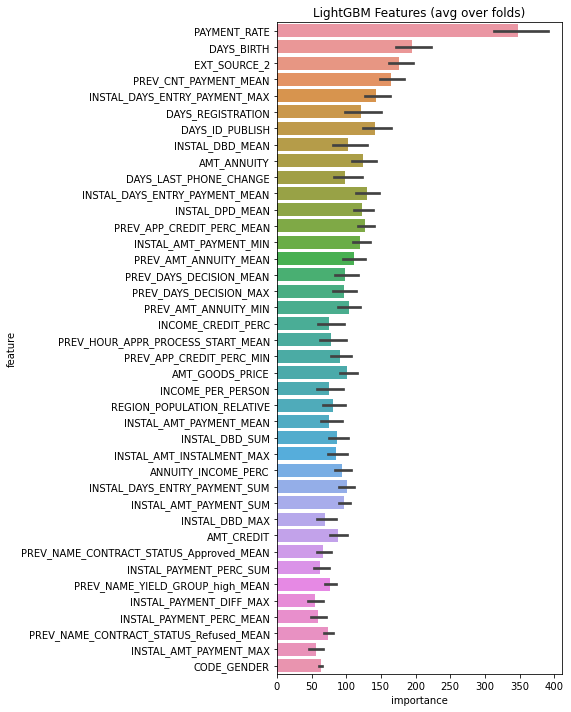

In [47]:
display_importances(feature_importance_df)

In [48]:
import shap
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(train_df[feats])

Setting feature_perturbation = "tree_path_dependent" because no background data was given.
LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [62]:
# Visualize a single prediction
# The shap plot shows features that contribute to pushing the output from the base value to the 
# actual predicted value
# Red colour pushes the predictions higher (towards positive)
# Blue colour indicates the predicitions lower (towards negative)
shap.force_plot(explainer.expected_value[1], shap_values[1][950,:], train_df[feats].iloc[950,:])

In [73]:
shap.force_plot(explainer.expected_value[1], shap_values[1][202,:], train_df[feats].iloc[202,:])

In [71]:
shap.force_plot(explainer.expected_value[1], shap_values[1][901,:], train_df[feats].iloc[901,:])

# Benjamin ideas
Have a general version for all customers if you don't choose a specific customers eg age / time of credit terms
Check rebase

In [50]:
# Visualize many predictions
#To keep the browser happy we only visualize 1,000 individuals.
shap.force_plot(explainer.expected_value[1], shap_values[1][:500,:], train_df[feats].iloc[:500,:])

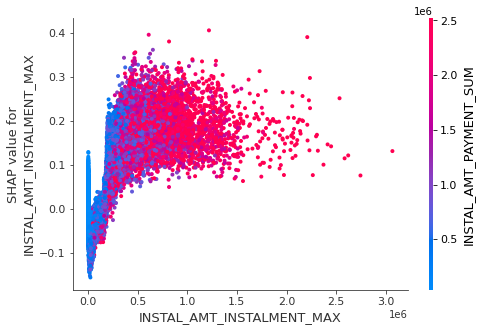

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


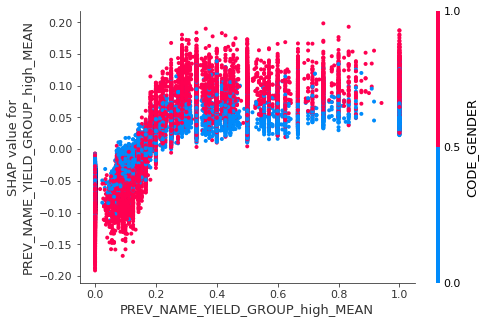

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


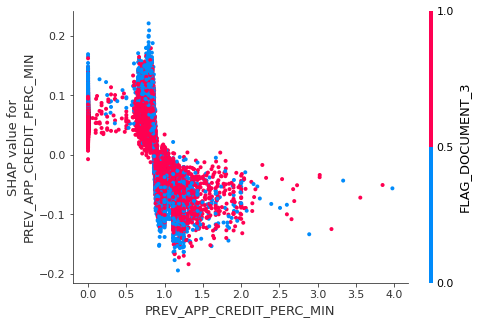

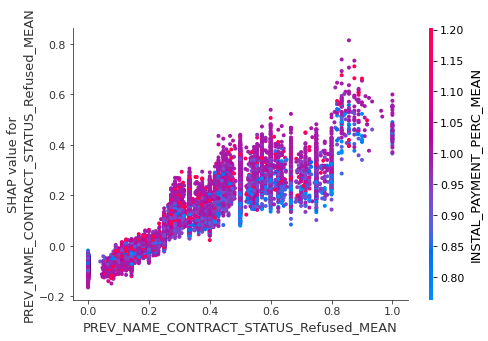

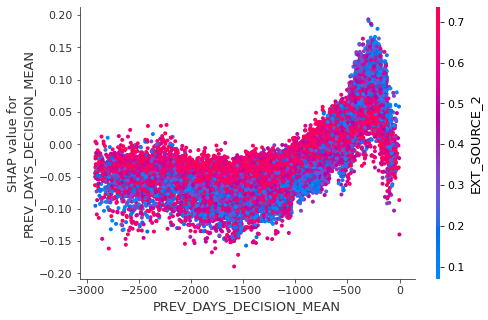

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


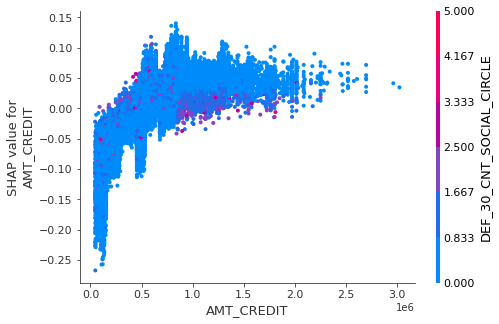

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


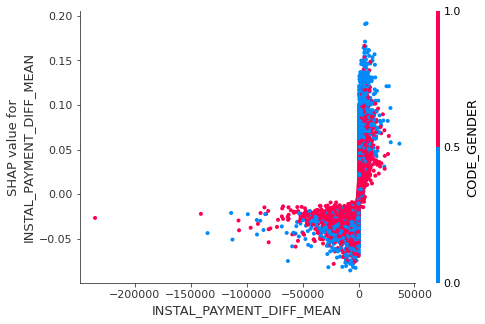

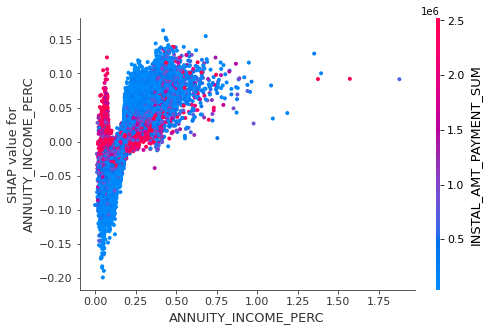

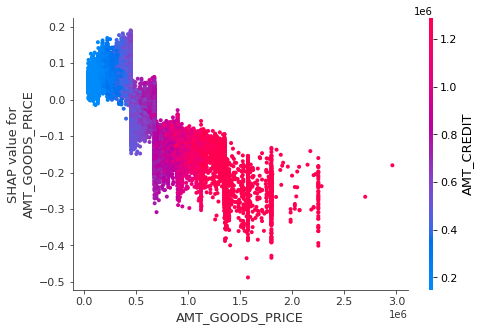

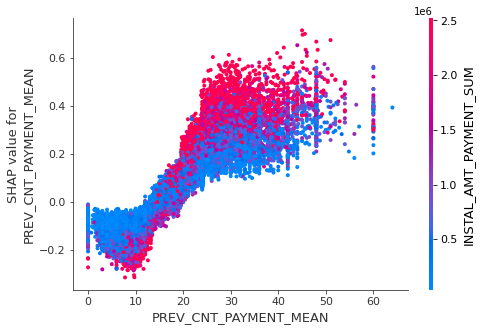

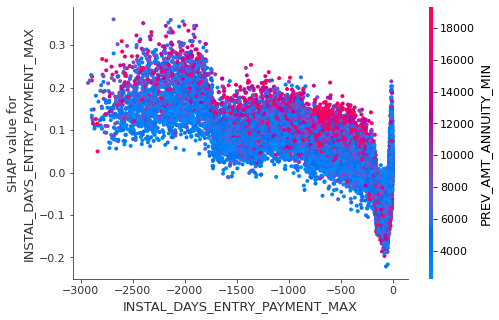

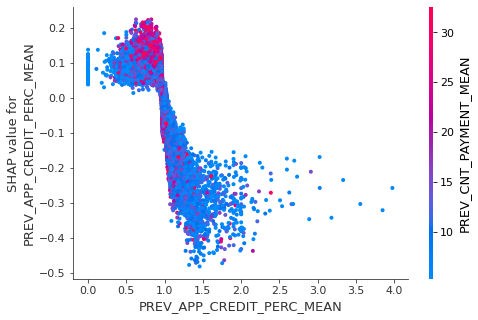

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


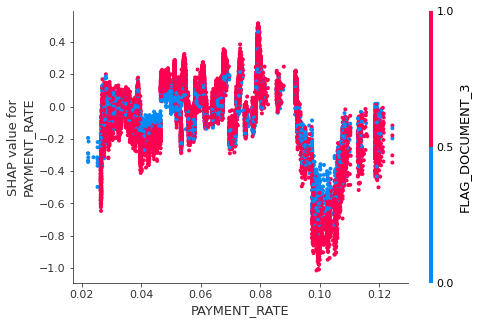

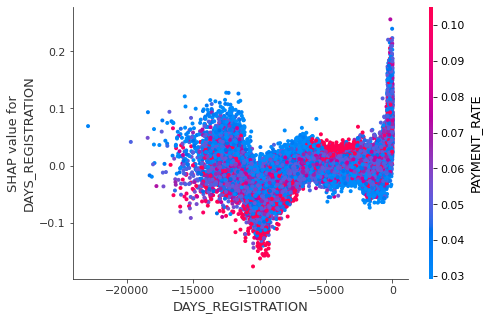

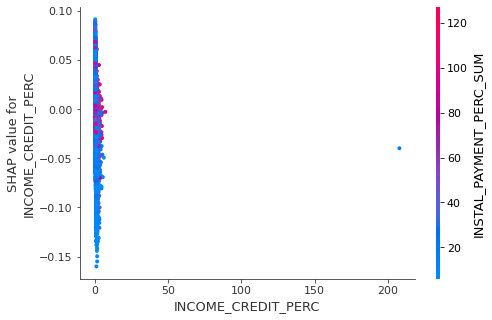

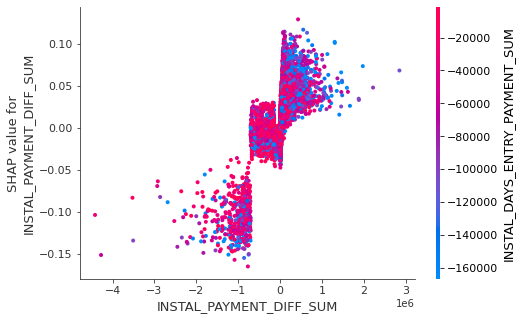

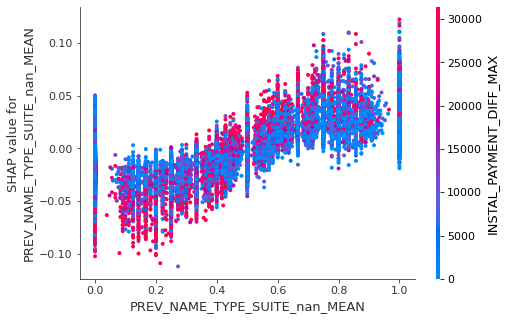

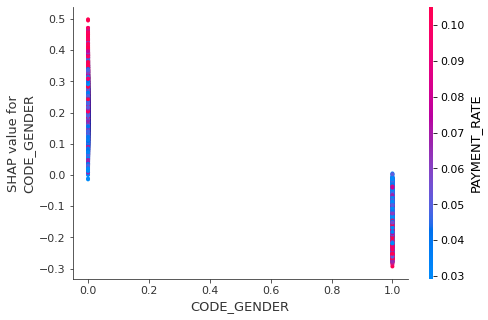

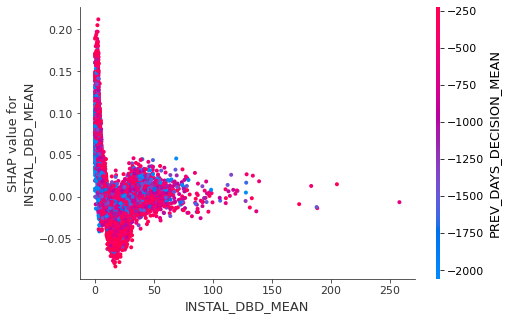

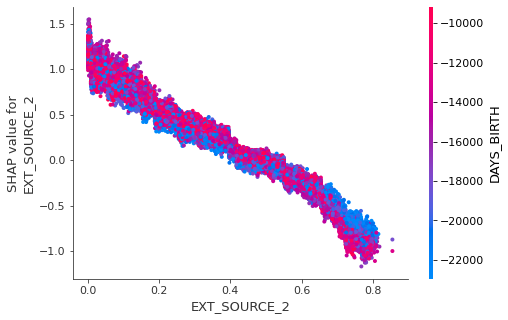

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


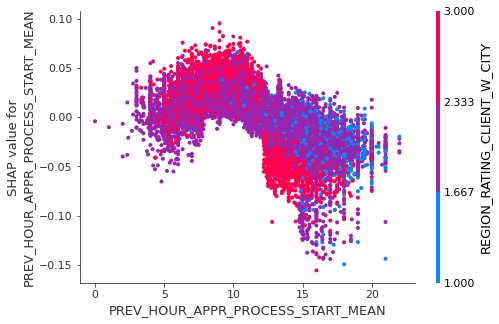

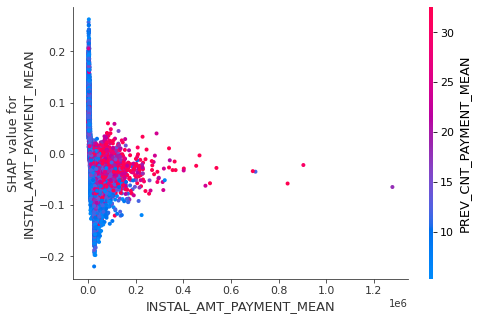

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


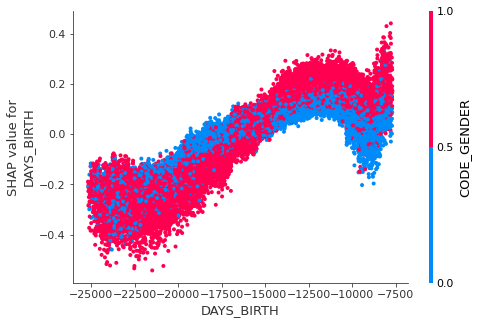

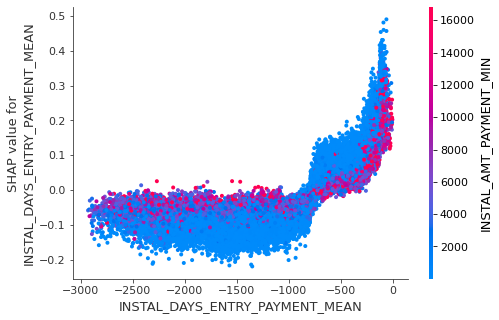

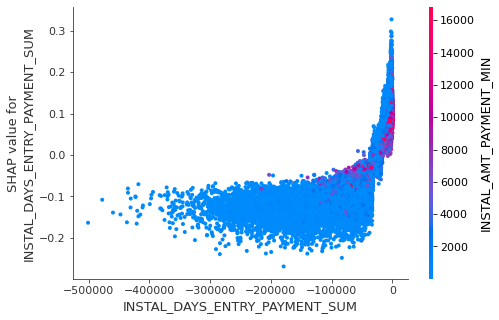

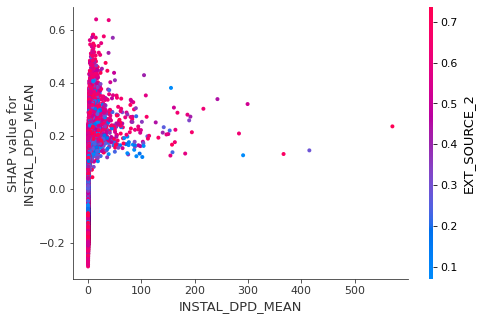

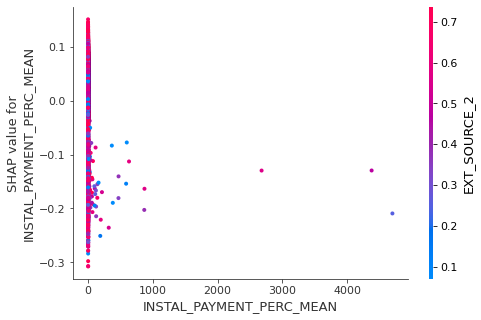

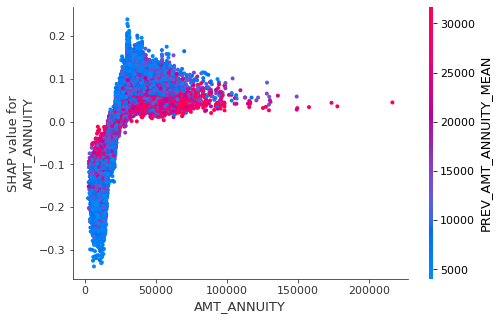

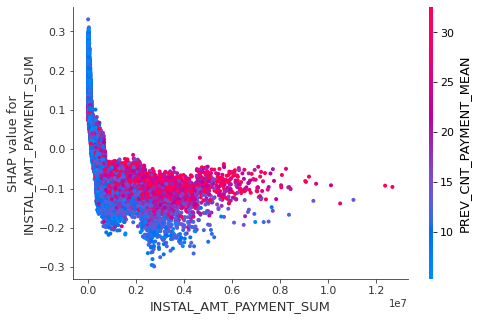

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


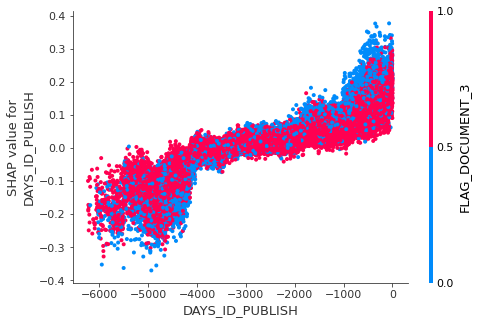

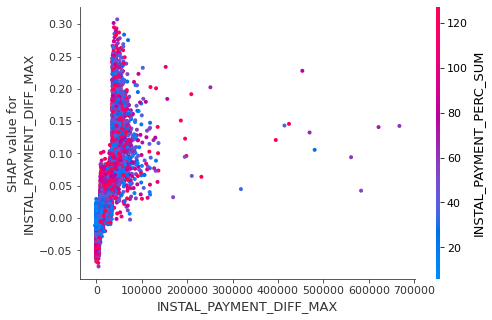

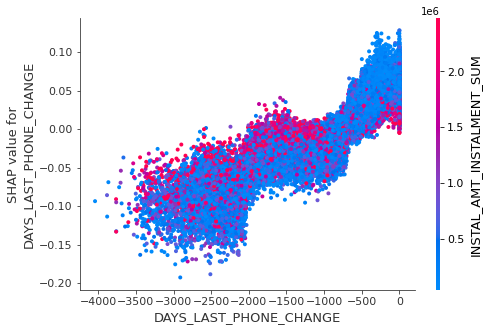

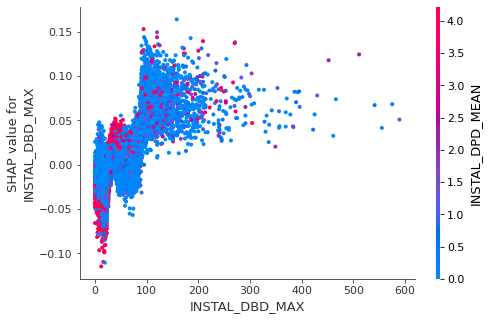

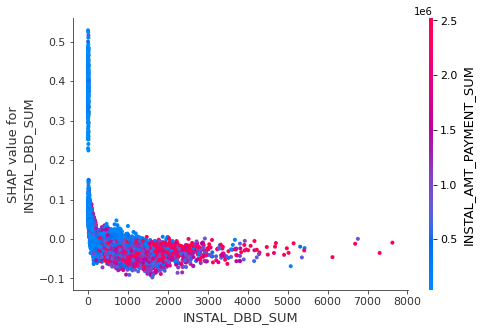

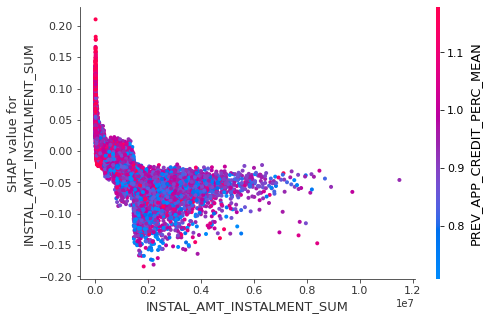

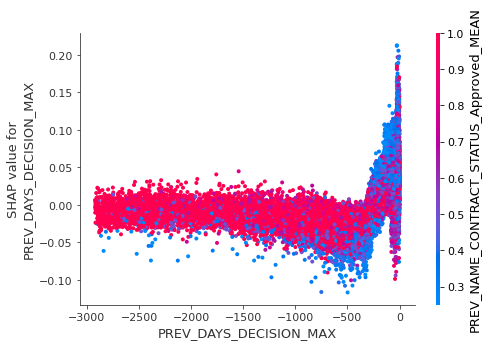

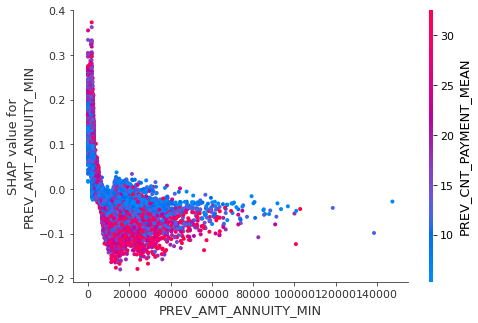

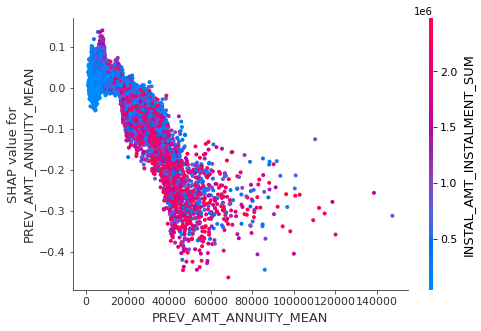

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


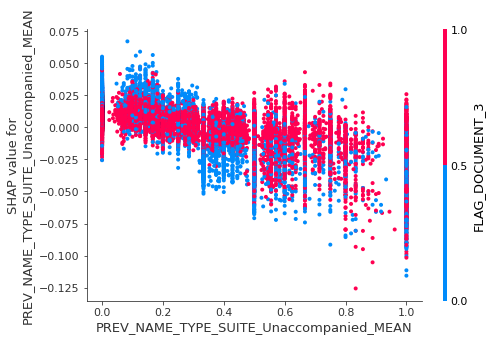

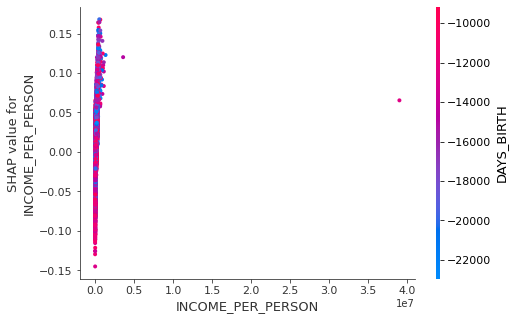

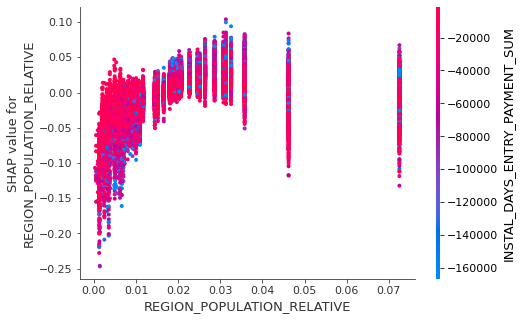

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


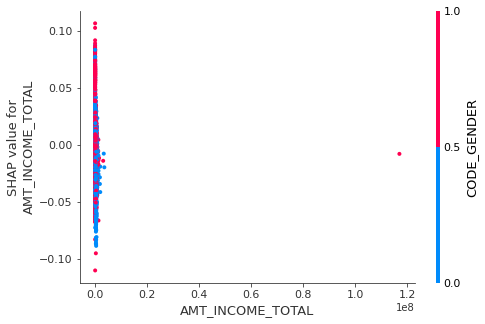

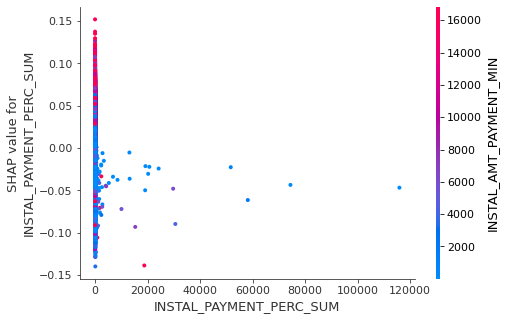

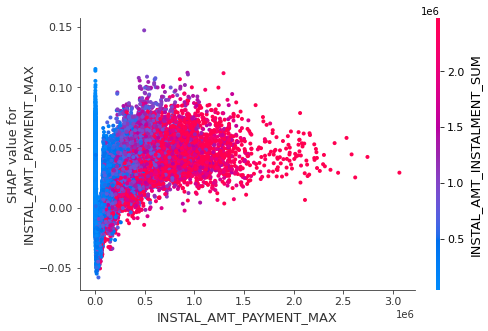

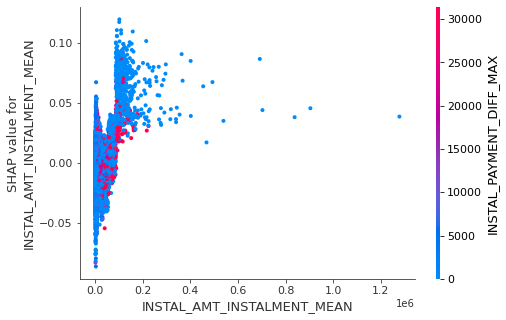

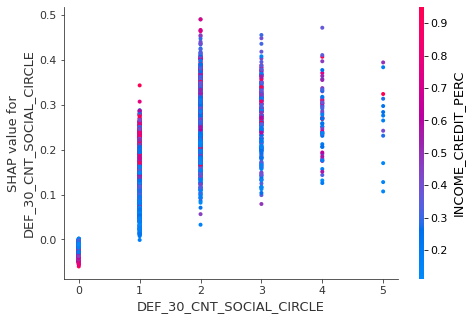

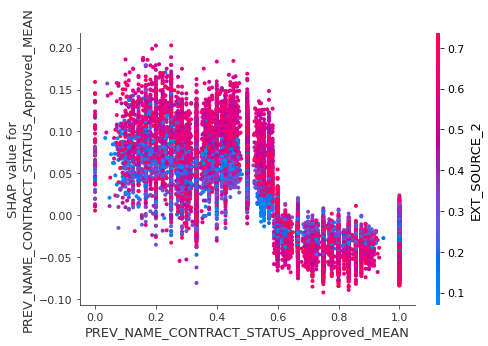

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


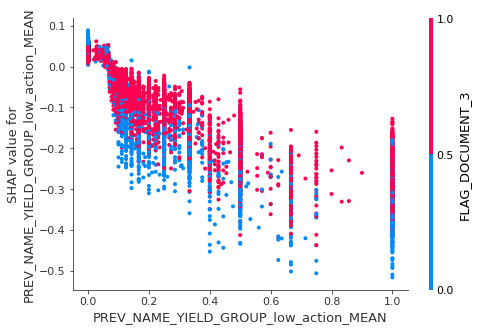

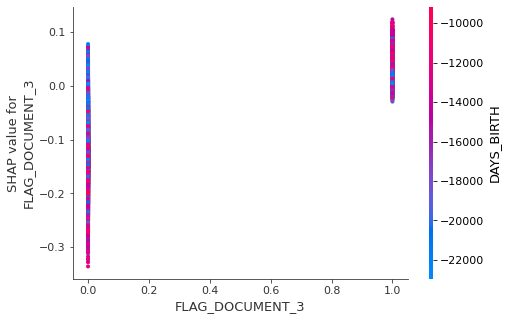

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


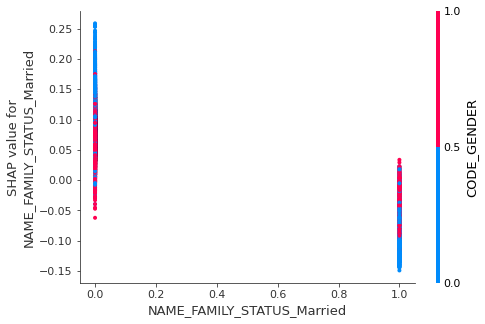

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


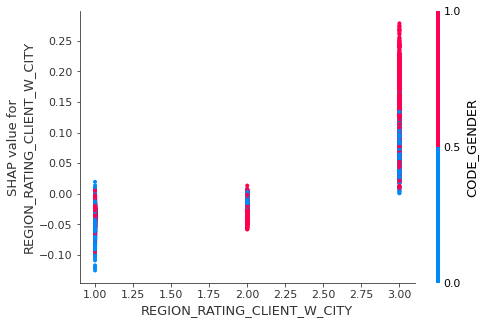

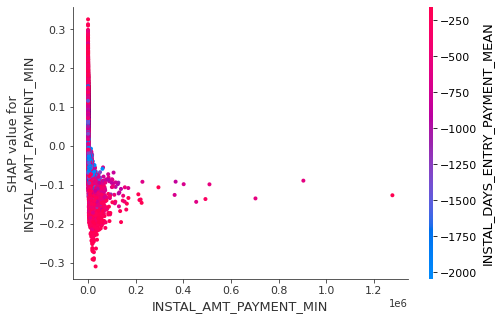

In [66]:
# single feature's effect on the model output
# we get a dot for every person
# plot a shap value of the feature vs the value of the feature for all instances in the dataset
# shows the change in prediction as the feature changes?
for name in train_x.columns:
    shap.dependence_plot(name, shap_values[1], train_df[feats], display_features = train_df[feats])

# Results Undersampling df Version Thresh 0.5 
Best  -0.644 params {'learning_rate': 0.06099309169741423, 'max_depth': 14.0, 'min_child_weight': 29.0, 'min_data_in_leaf': 3.0, 'min_split_gain': 0.21114525227111527, 'num_leaves': 40.0, 'reg_alpha': 0.13942580894344336, 'reg_lambda': 0.9677858993535176, 'subsample': 0.9509055197846566}


In [43]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[1661,  724],
       [ 761, 1618]])

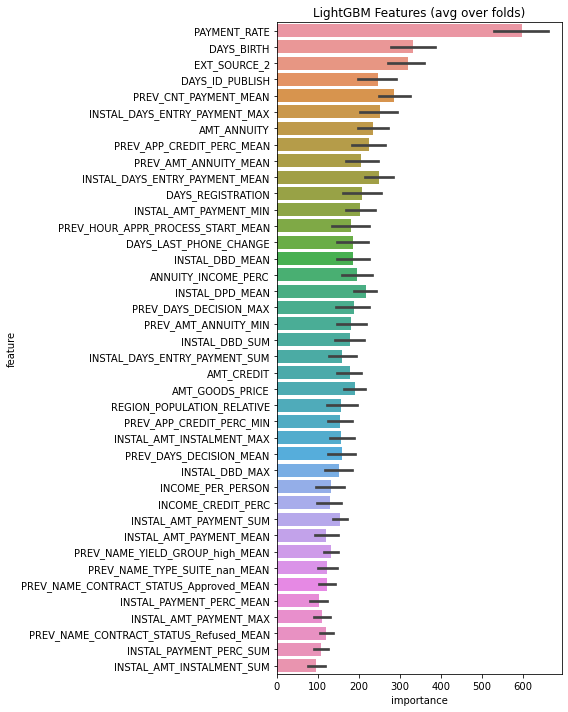

In [44]:
display_importances(feature_importance_df)

In [45]:
import shap
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(train_df[feats])

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [49]:
explainer.expected_value[1]

-0.020198995822116195

In [55]:
# Visualize a single prediction
# The shap plot shows features that contribute to pushing the output from the base value to the 
# actual predicted value
# Red colour pushes the predictions higher (towards positive)
# Blue colour indicates the predicitions lower (towards negative)
shap.force_plot(explainer.expected_value[1], shap_values[1][1100,:], train_df[feats].iloc[1100,:])

In [53]:
# Visualize a single prediction
shap.force_plot(explainer.expected_value[1], shap_values[1][630,:], train_df[feats].iloc[630,:])

In [52]:
# Visualize a single prediction
shap.force_plot(explainer.expected_value[1], shap_values[1][500,:], train_df[feats].iloc[500,:])

In [58]:
shap_values[1][500,:]

array([ 7.05884229e-02,  3.37483005e-03,  4.68446605e-02,  7.93953335e-02,
       -1.91968983e-02, -7.06214130e-04, -4.86166315e-03, -4.68189281e-02,
        1.90749557e-02, -9.02304444e-02,  3.22413894e-02, -3.28330667e-02,
        1.79191129e-01,  1.15459437e-02, -6.35571616e-03,  2.18328419e-02,
       -1.55527116e-02,  1.48463255e-01,  1.82504563e-02,  1.16112630e+00,
        4.46721017e-03, -5.71215719e-02, -2.65200588e-03, -4.44928957e-02,
       -5.99607434e-02,  2.52548009e-02, -1.25842312e-02, -8.64667106e-02,
       -9.54453320e-02, -1.27078139e-02,  4.92460192e-02, -2.38919129e-02,
        5.21796571e-03, -8.34389234e-02, -1.48512076e-02,  6.70730631e-03,
       -8.03667446e-03, -2.68268253e-02, -3.62399031e-03, -8.12011509e-02,
       -3.91357619e-02, -2.43308057e-02, -1.84486610e-02,  8.30602102e-03,
       -1.69361535e-02,  2.29599674e-01, -7.85681652e-03,  8.54512383e-03,
        1.48843271e-02, -1.96044124e-02, -6.47716942e-03, -5.74004050e-02])

In [57]:
# Visualize many predictions
#To keep the browser happy we only visualize 1,000 individuals.
shap.force_plot(explainer.expected_value[1], shap_values[1][:500,:], train_df[feats].iloc[:500,:])

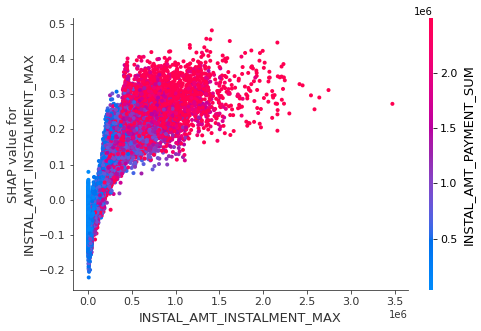

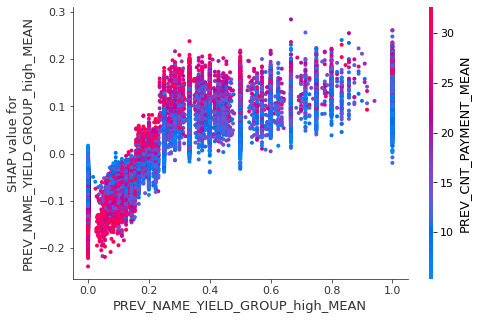

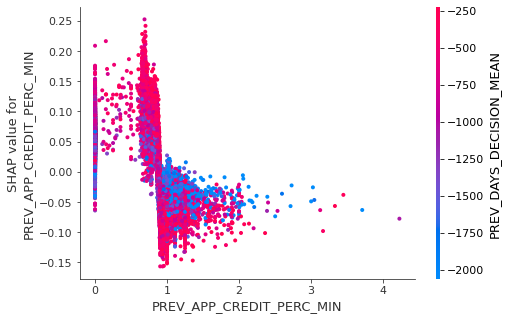

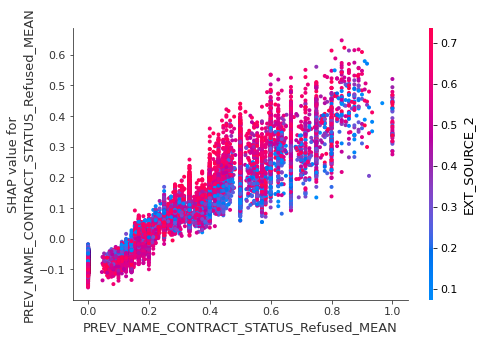

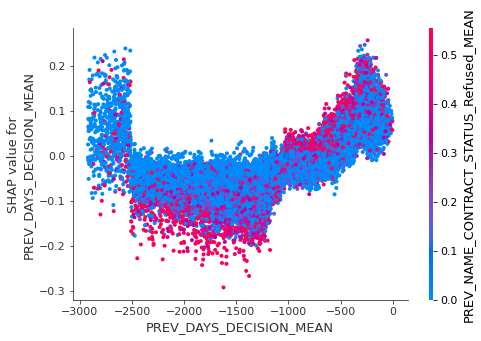

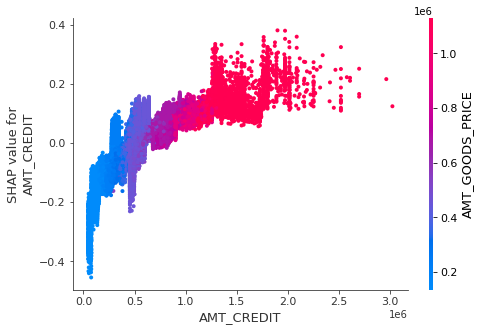

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


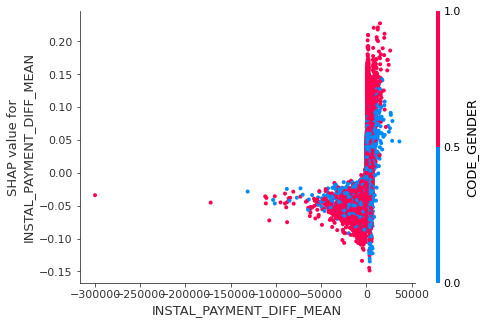

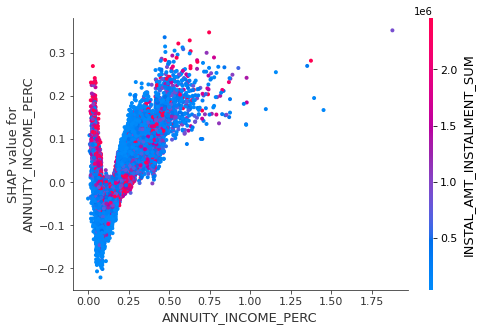

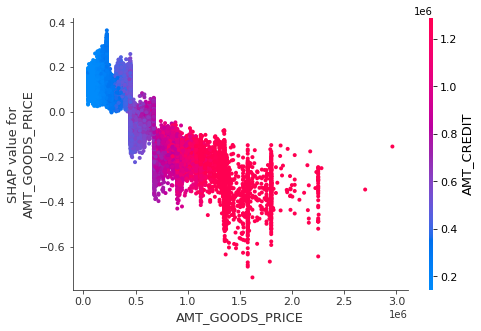

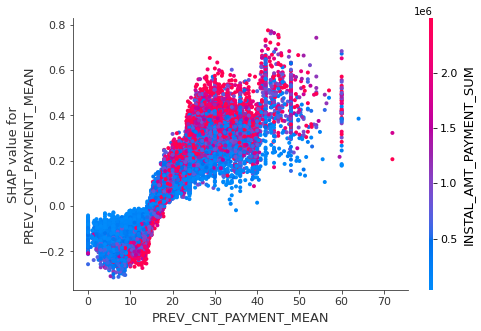

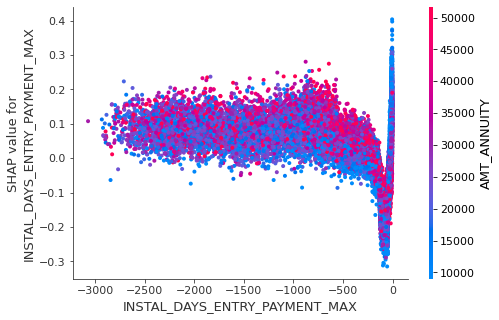

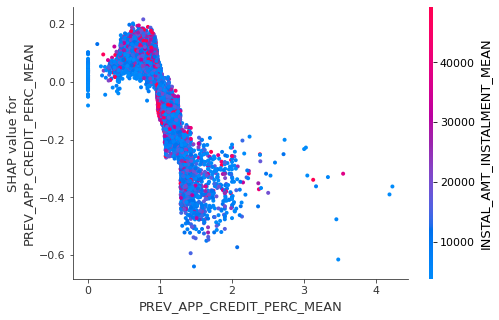

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


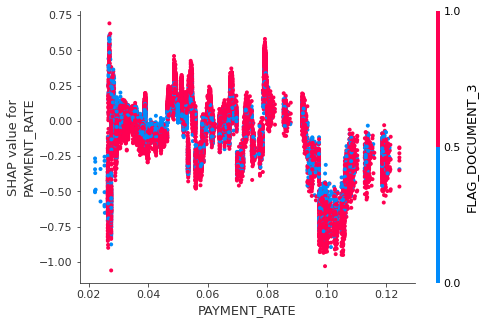

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


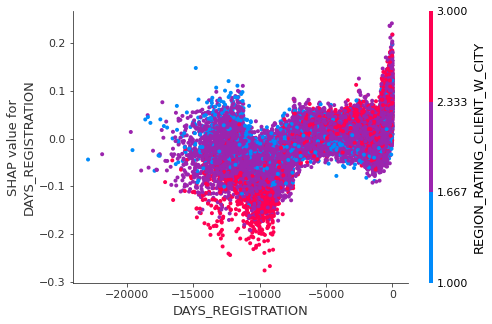

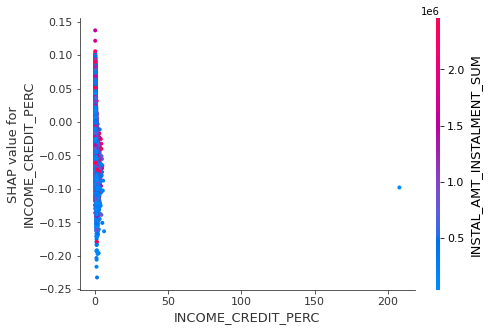

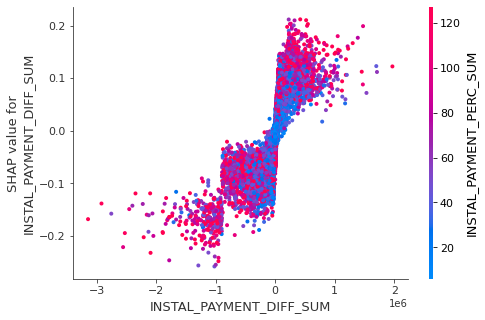

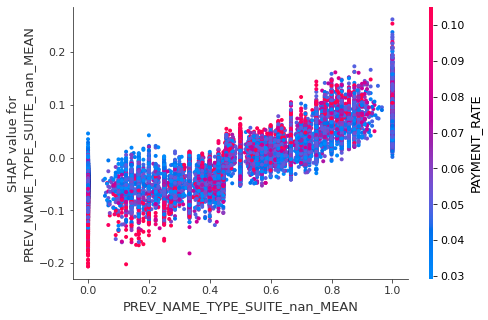

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


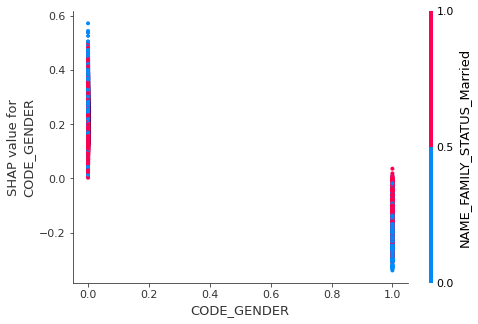

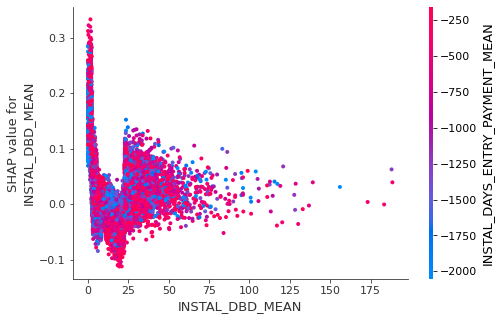

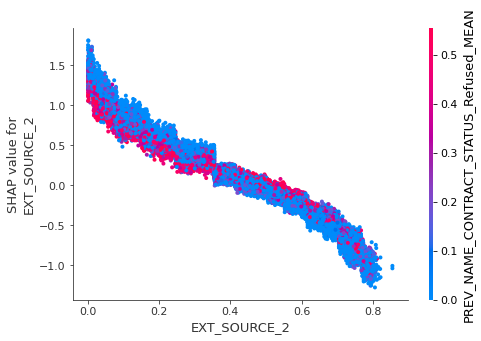

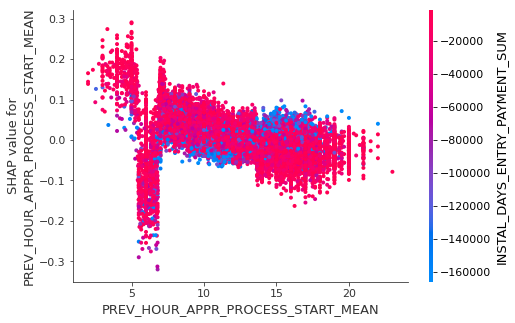

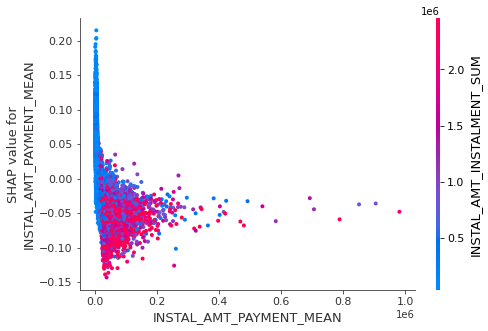

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


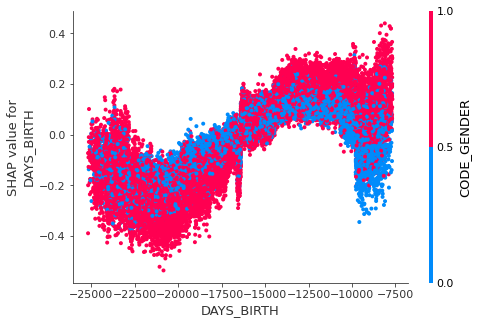

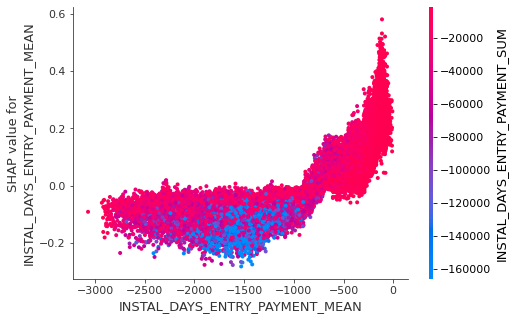

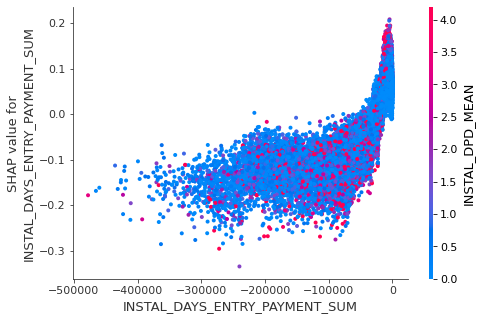

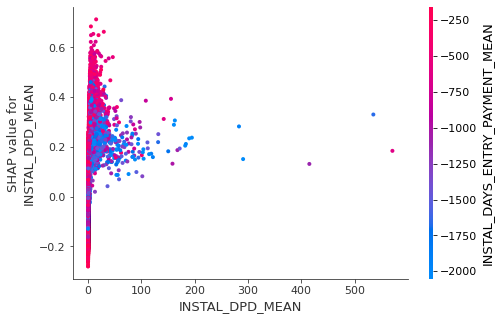

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


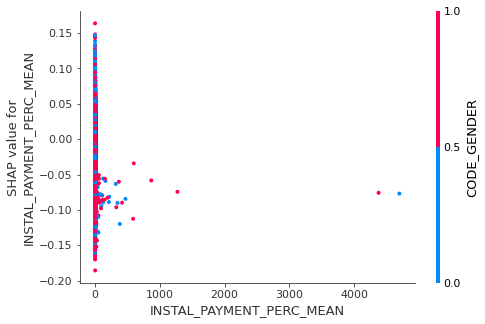

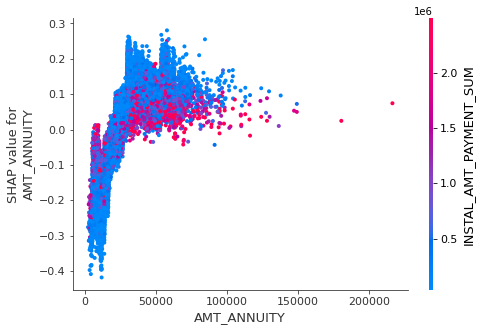

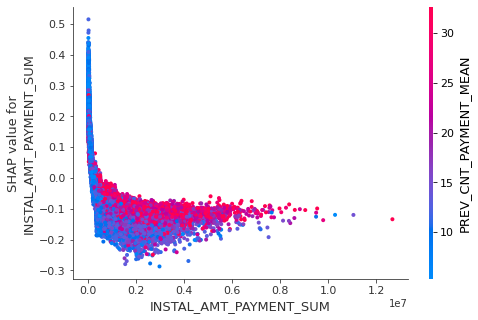

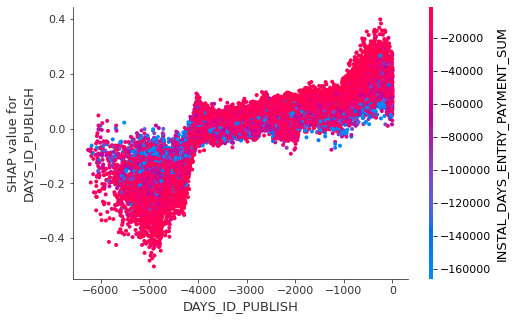

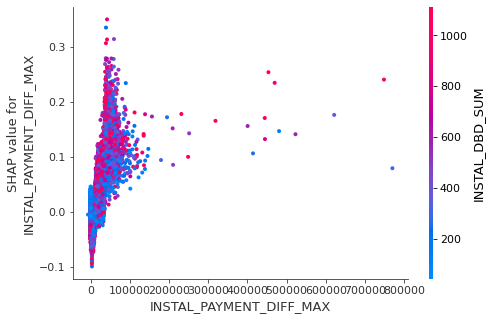

...

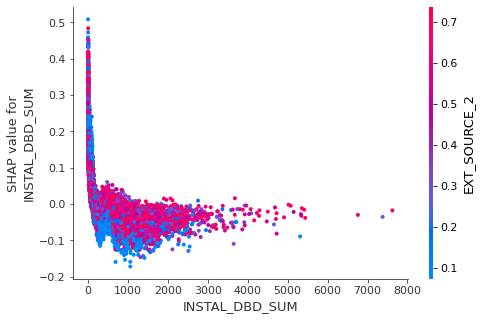

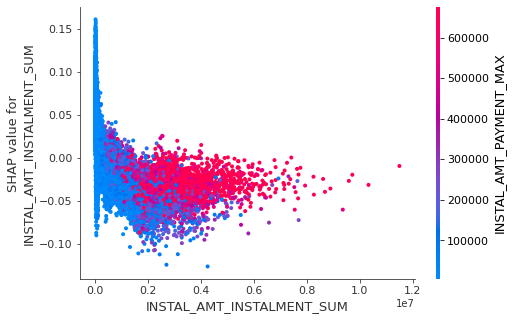

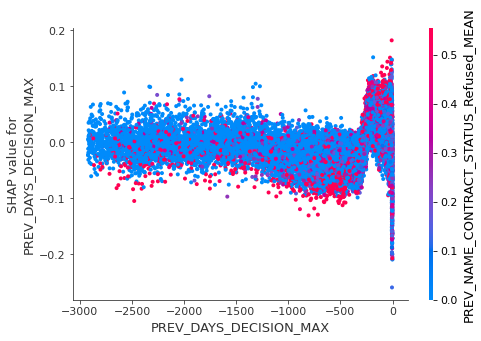

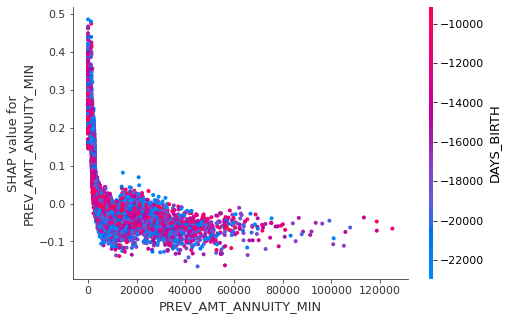

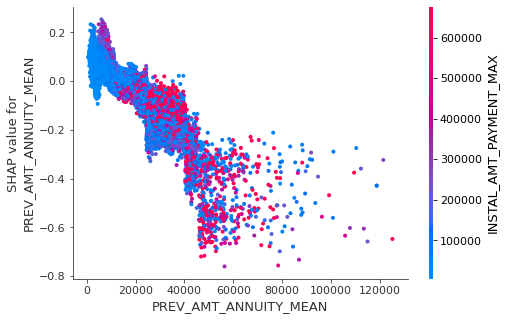

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


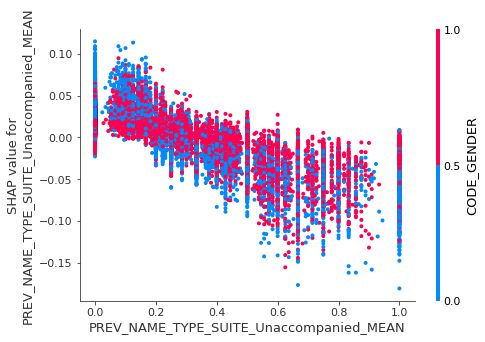

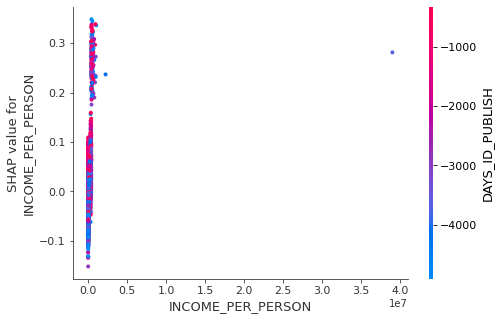

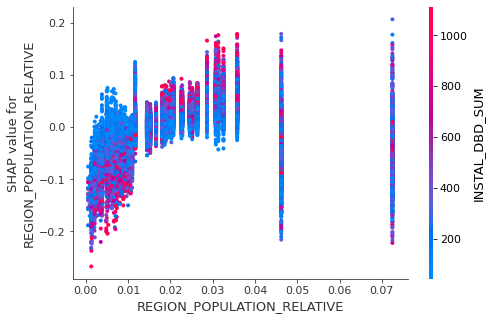

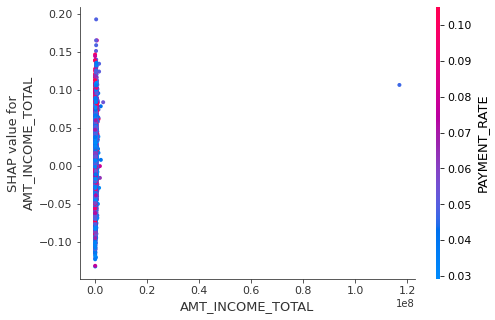

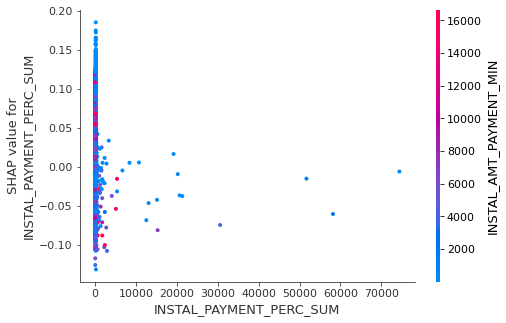

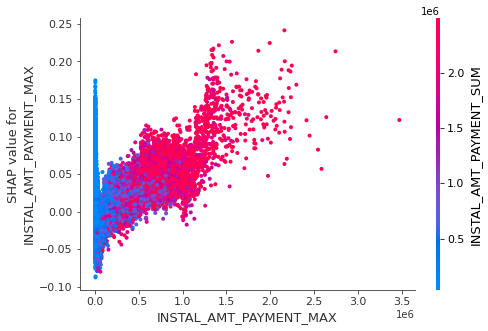

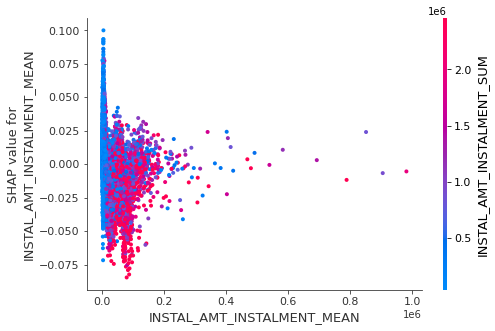

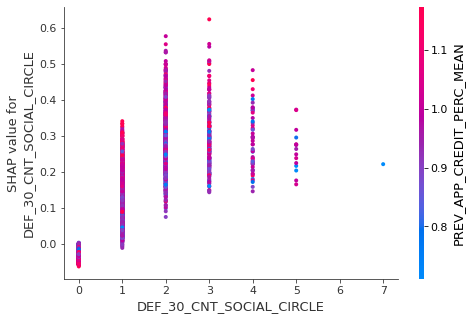

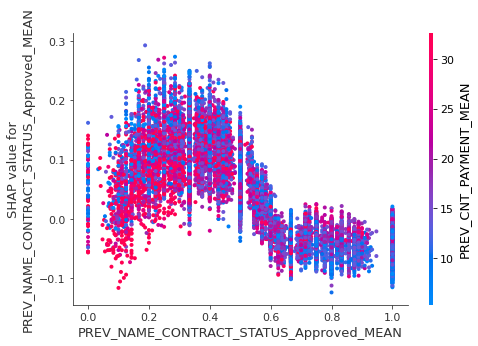

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


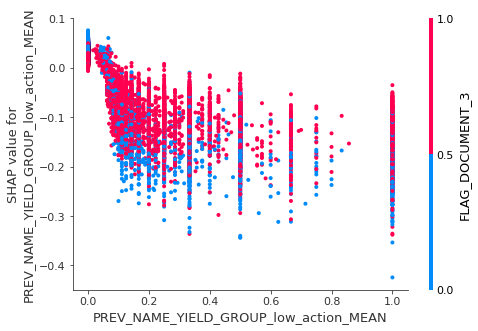

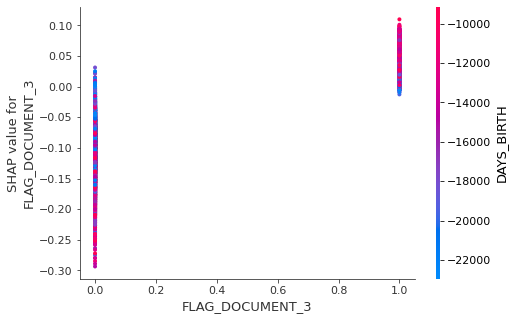

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


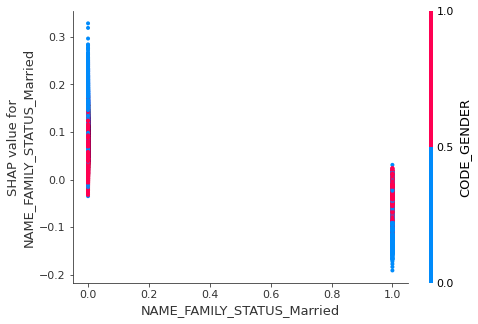

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


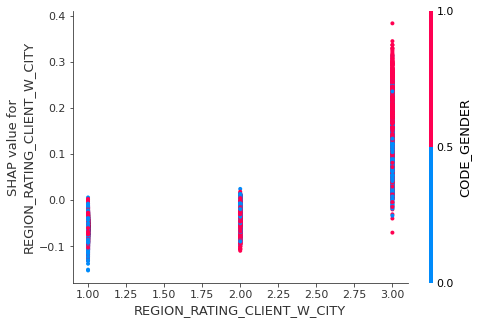

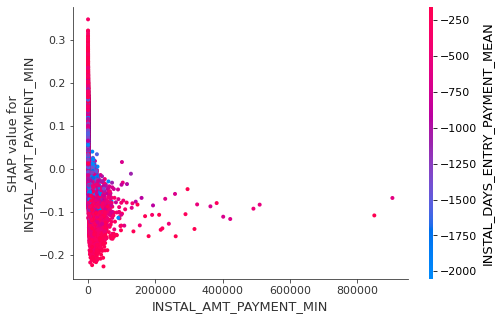

In [59]:
# single feature's effect on the model output
# we get a dot for every person
# plot a shap value of the feature vs the value of the feature for all instances in the dataset
# shows the change in prediction as the feature changes?
for name in train_x.columns:
    shap.dependence_plot(name, shap_values[1], train_df[feats], display_features = train_df[feats])

# Results Undersampling df Version Thresh 0.5 
24000
Best  -0.646 params 
{'learning_rate': 0.10410485804309211, 'max_depth': 9.0, 'min_child_weight': 38.0, 
 'min_data_in_leaf': 16.0, 'min_split_gain': 0.7643255875000656, 'num_leaves': 16.0, 
 'reg_alpha': 0.044491576885502565, 'reg_lambda': 0.6078274796789973, 'subsample': 0.03471194618415732}


In [163]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[1673,  712],
       [ 754, 1625]])

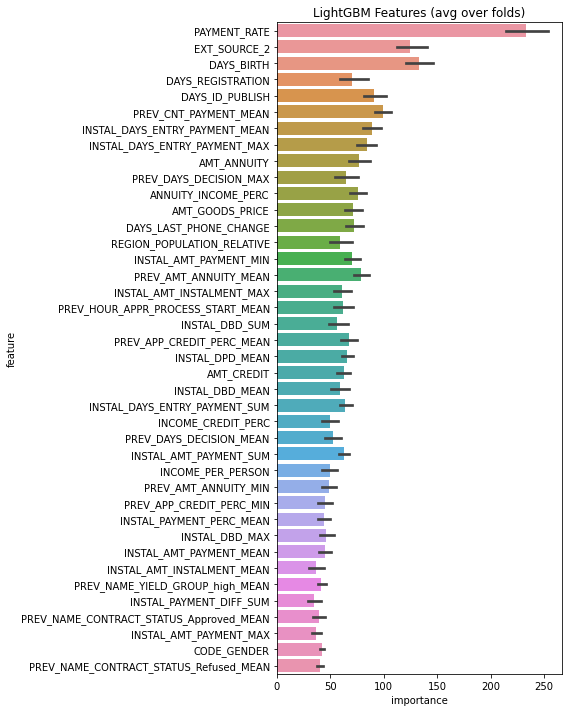

In [164]:
display_importances(feature_importance_df)

In [168]:
# for now y_pred is the probability that the value is 1
my_valids = [1 if i >= 0.45 else 0 for i in valid_preds_proba[:,1]]
    
my_valids = pd.Series(my_valids)

confusion_matrix(valid_y, my_valids)

array([[1480,  905],
       [ 588, 1791]])

In [203]:
import shap
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(train_df[feats])

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [204]:
# Visualize a single prediction
# The shap plot shows features that contribute to pushing the output from the base value to the 
# actual predicted value
# Red colour pushes the predictions higher (towards positive)
# Blue colour indicates the predicitions lower (towards negative)
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], train_df[feats].iloc[0,:])

In [205]:
# Visualize a single prediction
shap.force_plot(explainer.expected_value[1], shap_values[1][10,:], train_df[feats].iloc[10,:])

In [206]:
# Visualize a single prediction
shap.force_plot(explainer.expected_value[1], shap_values[1][100,:], train_df[feats].iloc[100,:])

In [198]:
shap_values

[array([[ 0.0809857 , -0.0742577 , -0.03896319, ..., -0.09808995,
          0.01982958, -0.06815909],
        [ 0.04695657,  0.00639413,  0.02428204, ...,  0.02545929,
          0.00705516, -0.08529872],
        [ 0.03538161,  0.04221174,  0.04537158, ..., -0.1378743 ,
          0.01024545,  0.03490025],
        ...,
        [ 0.01510322, -0.09606074, -0.00597626, ...,  0.04130086,
          0.0080175 , -0.07653569],
        [ 0.02737912,  0.01910817,  0.00647842, ..., -0.06106226,
          0.00204984, -0.18731447],
        [ 0.03053025, -0.04810228, -0.0227501 , ...,  0.02225631,
          0.01131644,  0.07757127]]),
 array([[-0.0809857 ,  0.0742577 ,  0.03896319, ...,  0.09808995,
         -0.01982958,  0.06815909],
        [-0.04695657, -0.00639413, -0.02428204, ..., -0.02545929,
         -0.00705516,  0.08529872],
        [-0.03538161, -0.04221174, -0.04537158, ...,  0.1378743 ,
         -0.01024545, -0.03490025],
        ...,
        [-0.01510322,  0.09606074,  0.00597626, ..., -

In [196]:
explainer.expected_value

[0.018261432005752004, -0.018261432005752004]

In [199]:
# Visualize a single prediction
# 
shap.force_plot(explainer.expected_value[1], shap_values[1][3,:], train_df[feats].iloc[3,:])

In [189]:
# Visualize many predictions
#To keep the browser happy we only visualize 1,000 individuals.
shap.force_plot(explainer.expected_value[1], shap_values[1][:1000,:], train_df[feats].iloc[:1000,:])

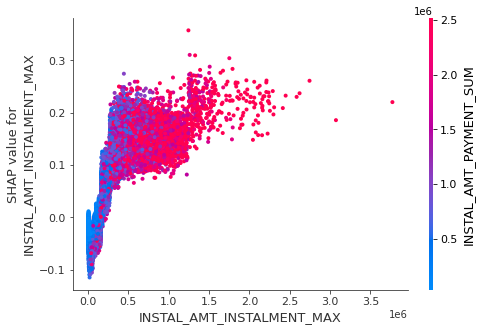

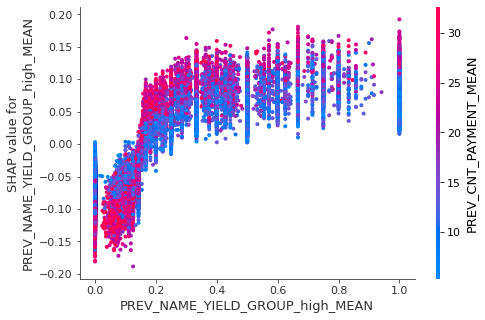

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


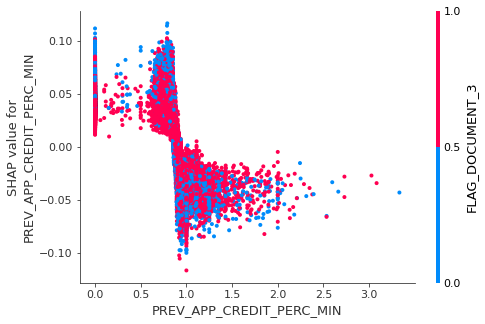

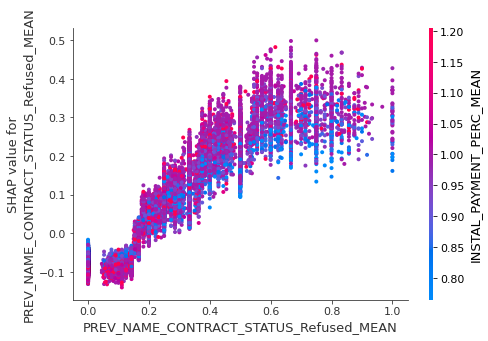

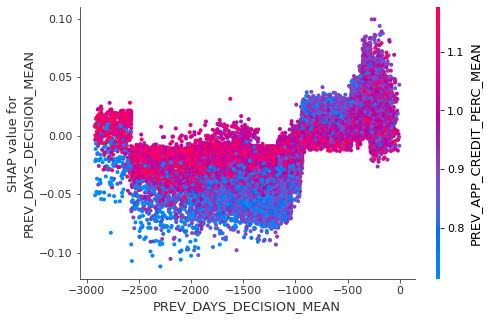

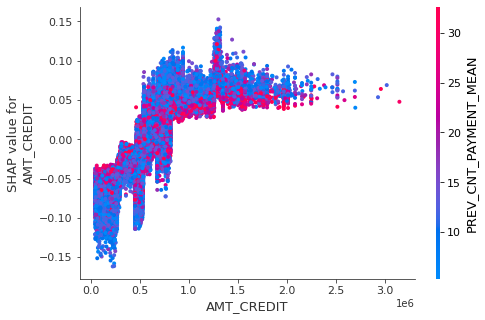

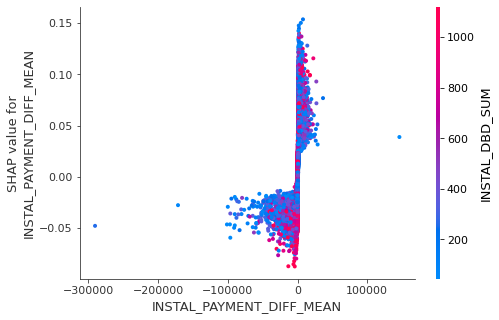

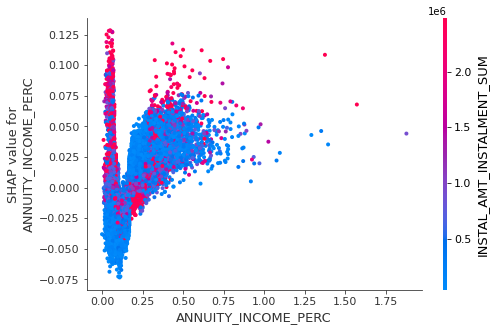

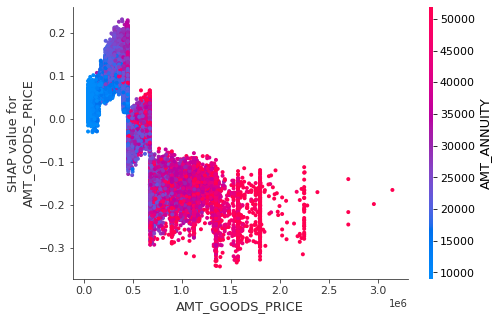

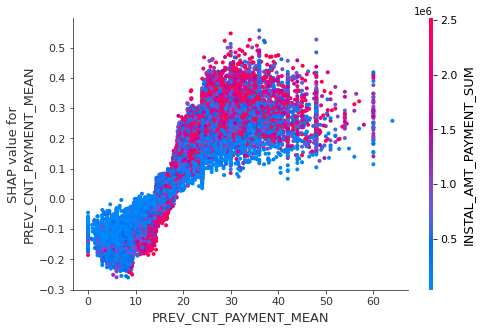

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


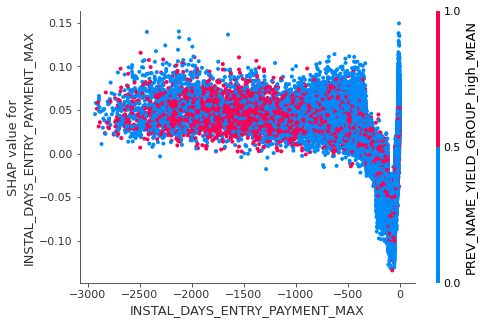

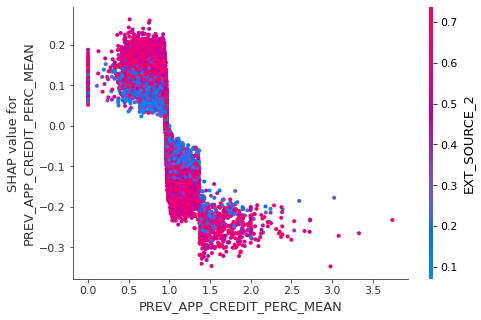

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


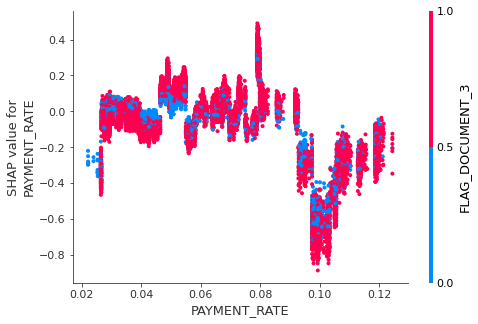

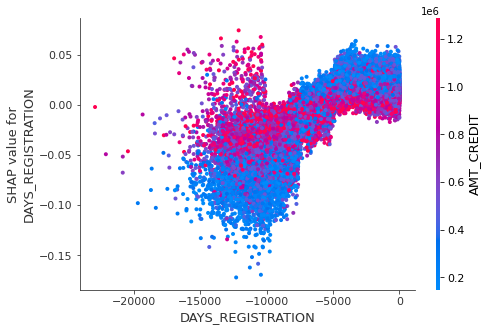

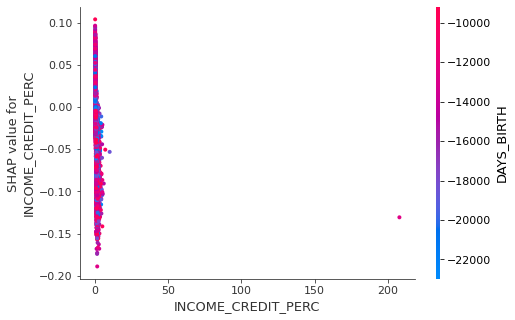

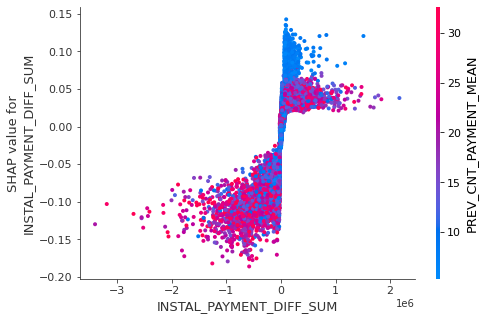

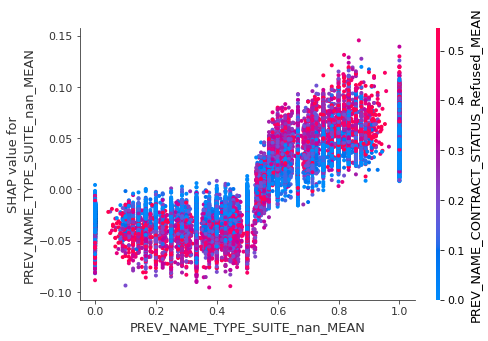

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


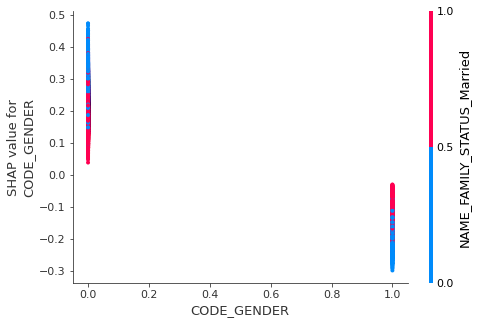

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


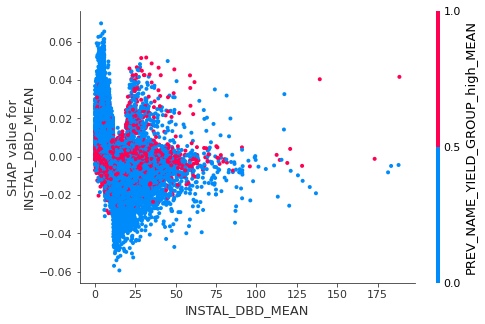

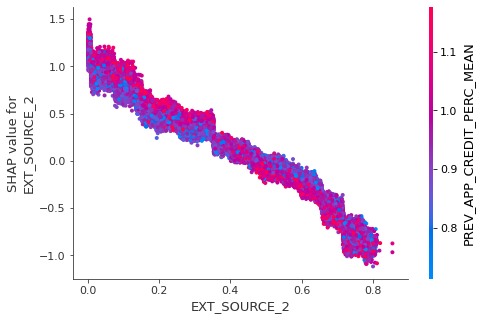

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


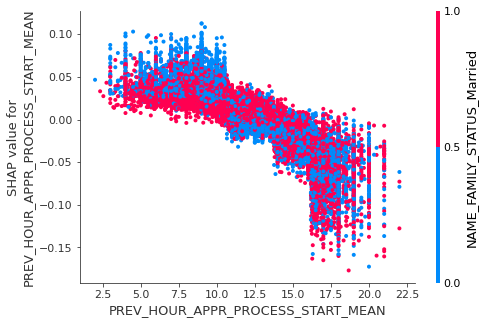

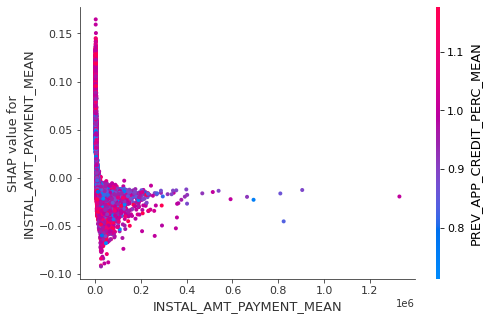

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


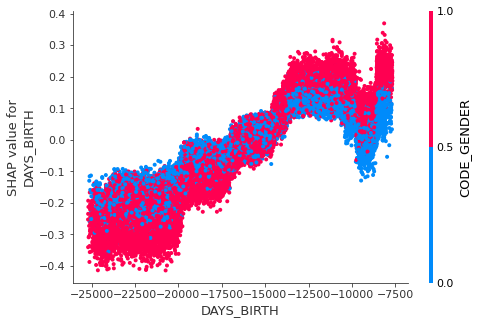

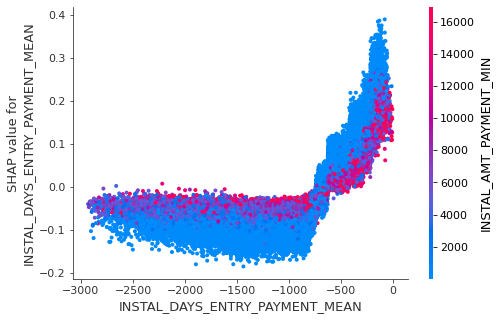

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


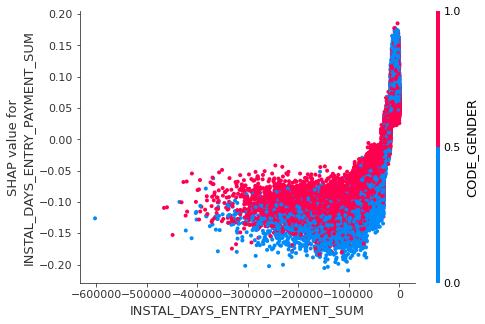

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


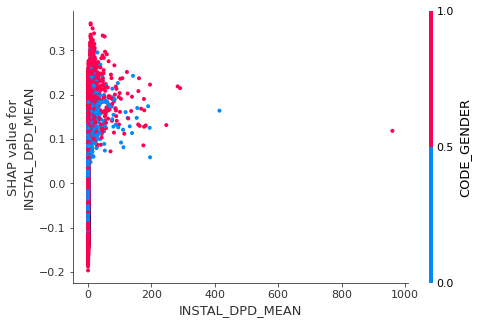

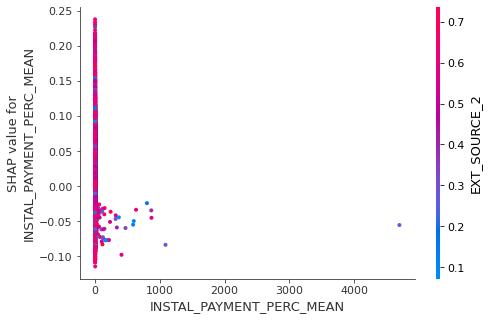

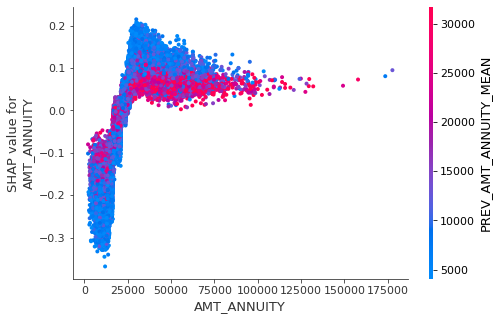

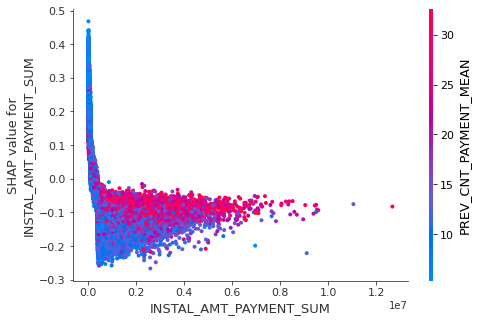

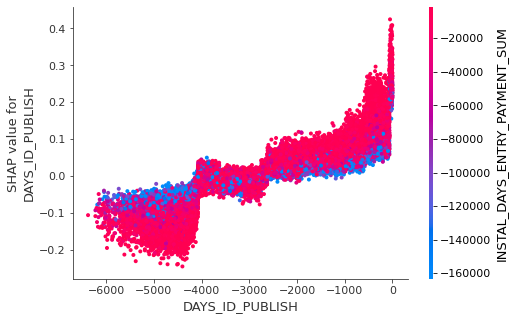

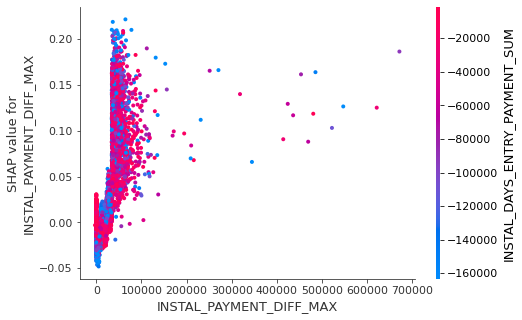

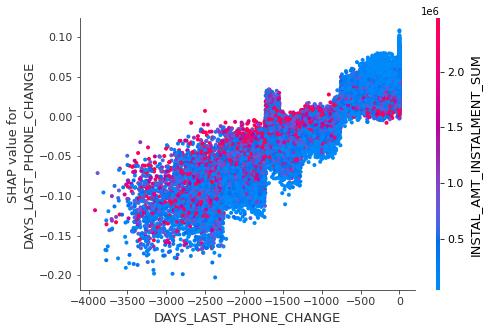

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


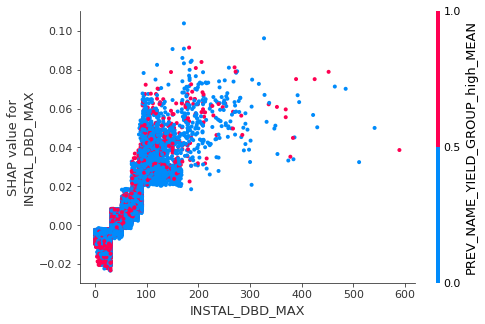

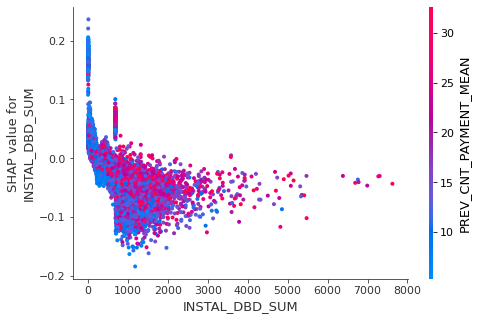

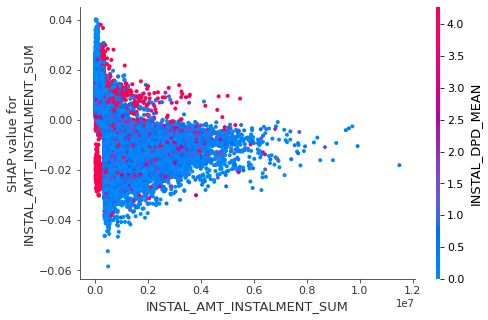

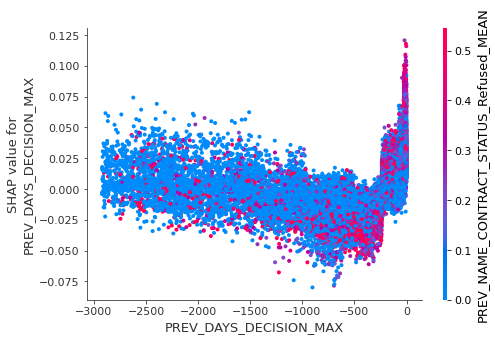

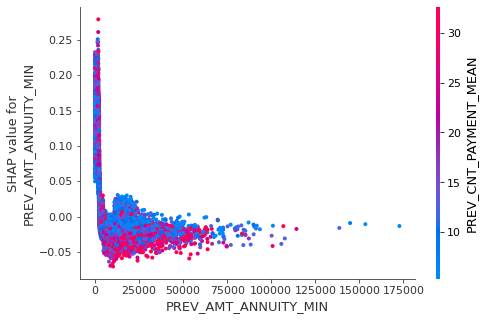

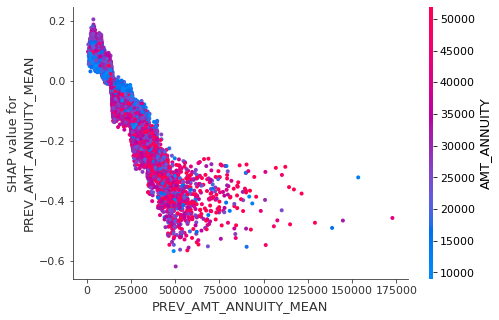

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


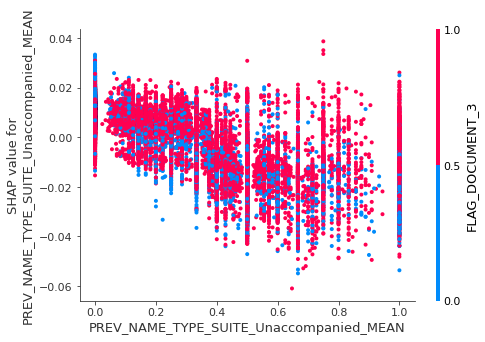

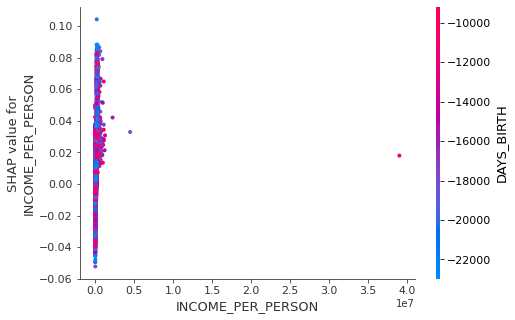

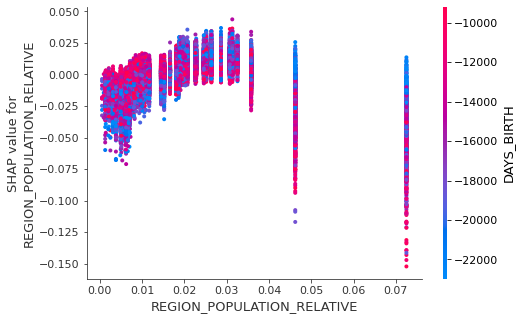

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


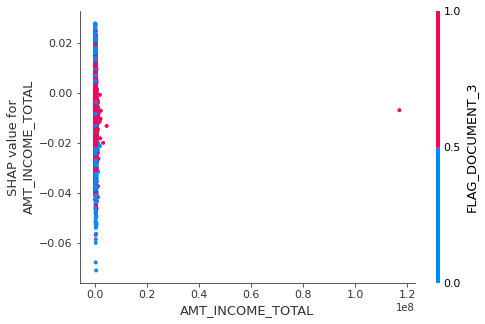

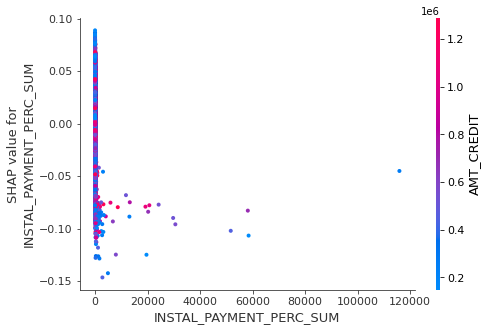

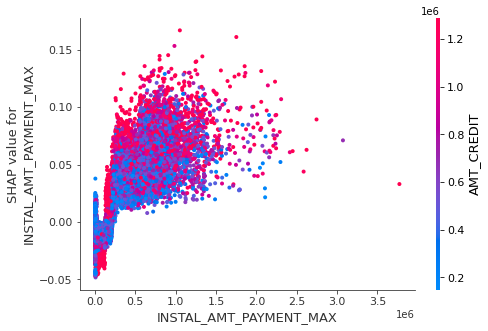

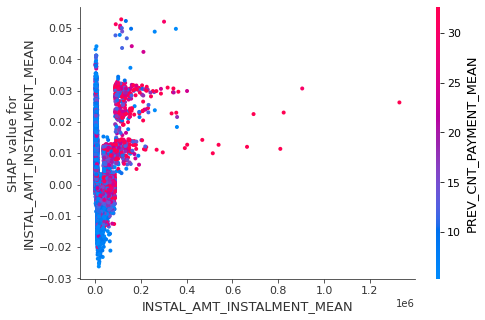

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


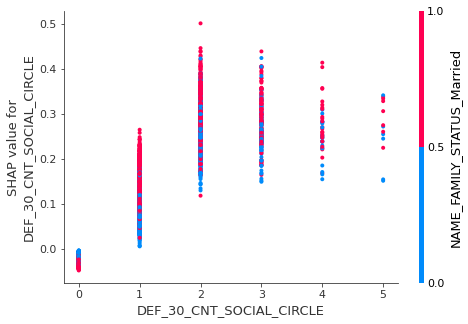

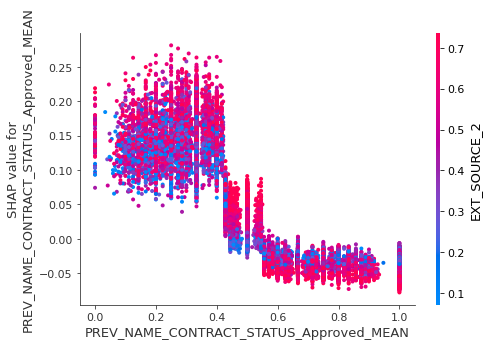

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


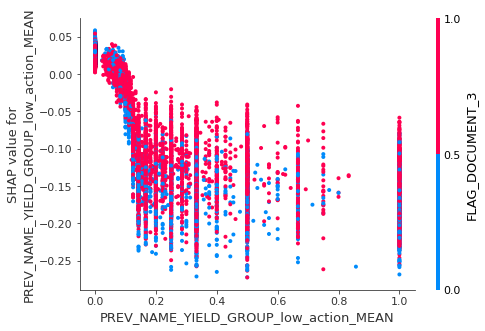

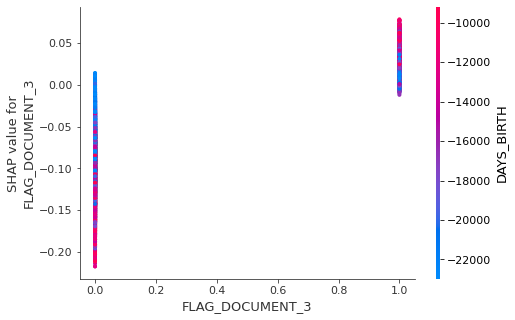

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


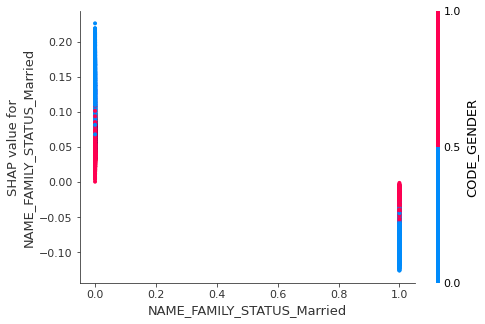

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


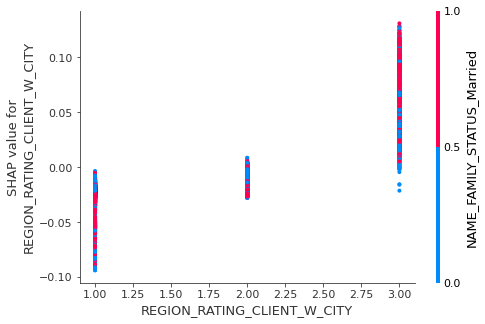

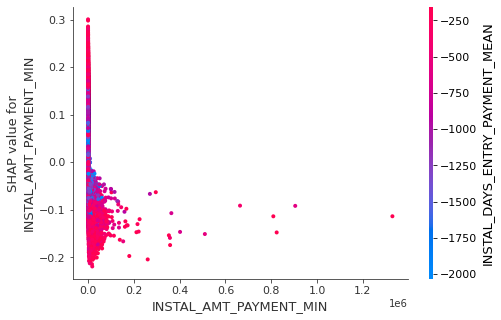

In [190]:
# single feature's effect on the model output
# we get a dot for every person
# plot a shap value of the feature vs the value of the feature for all instances in the dataset
# shows the change in prediction as the feature changes?
for name in train_x.columns:
    shap.dependence_plot(name, shap_values[1], train_df[feats], display_features = train_df[feats])

In [178]:

shap_values = shap.TreeExplainer(model).shap_values(train_x)
len(shap_values)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


2

In [179]:
shap_values

[array([[ 0.0809857 , -0.0742577 , -0.03896319, ..., -0.09808995,
          0.01982958, -0.06815909],
        [ 0.04695657,  0.00639413,  0.02428204, ...,  0.02545929,
          0.00705516, -0.08529872],
        [ 0.03538161,  0.04221174,  0.04537158, ..., -0.1378743 ,
          0.01024545,  0.03490025],
        ...,
        [ 0.01510322, -0.09606074, -0.00597626, ...,  0.04130086,
          0.0080175 , -0.07653569],
        [ 0.02737912,  0.01910817,  0.00647842, ..., -0.06106226,
          0.00204984, -0.18731447],
        [ 0.03053025, -0.04810228, -0.0227501 , ...,  0.02225631,
          0.01131644,  0.07757127]]),
 array([[-0.0809857 ,  0.0742577 ,  0.03896319, ...,  0.09808995,
         -0.01982958,  0.06815909],
        [-0.04695657, -0.00639413, -0.02428204, ..., -0.02545929,
         -0.00705516,  0.08529872],
        [-0.03538161, -0.04221174, -0.04537158, ...,  0.1378743 ,
         -0.01024545, -0.03490025],
        ...,
        [-0.01510322,  0.09606074,  0.00597626, ..., -

In [184]:
# the waterfall_plot shows how we get from shap_values.base_values to model.predict(X)[sample_ind]
shap.plots.waterfall(shap_values, max_display= 20)

AttributeError: 'list' object has no attribute 'base_values'

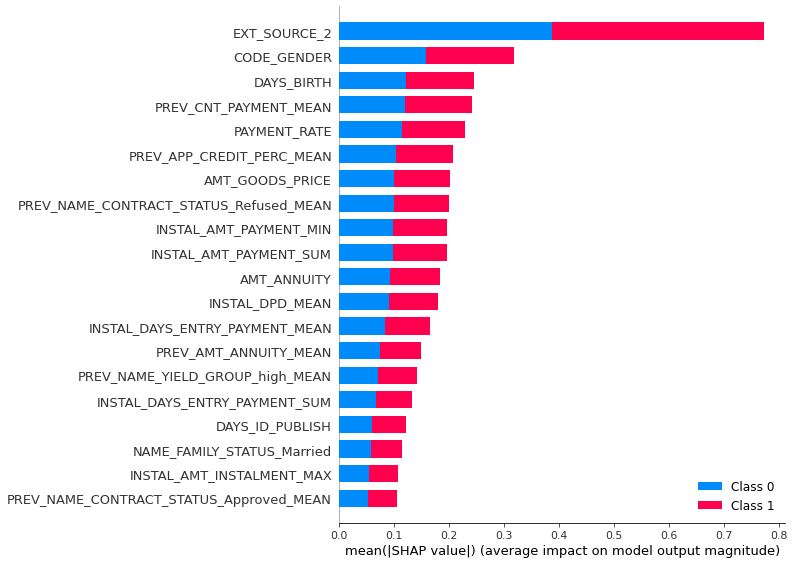

In [183]:
shap.summary_plot(shap_values, train_x)
                  #plot_type="bar")

In [175]:
# equilibrated case
background = train_x.sample(1000) #X is equilibrated 
background

,INSTAL_AMT_INSTALMENT_MAX,PREV_NAME_YIELD_GROUP_high_MEAN,PREV_APP_CREDIT_PERC_MIN,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,PREV_DAYS_DECISION_MEAN,AMT_CREDIT,INSTAL_PAYMENT_DIFF_MEAN,ANNUITY_INCOME_PERC,AMT_GOODS_PRICE,PREV_CNT_PAYMENT_MEAN,...,INSTAL_PAYMENT_PERC_SUM,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_INSTALMENT_MEAN,DEF_30_CNT_SOCIAL_CIRCLE,PREV_NAME_CONTRACT_STATUS_Approved_MEAN,PREV_NAME_YIELD_GROUP_low_action_MEAN,FLAG_DOCUMENT_3,NAME_FAMILY_STATUS_Married,REGION_RATING_CLIENT_W_CITY,INSTAL_AMT_PAYMENT_MIN
87404,32193.225,0.750,0.859328,0.750,-946.250000,746280.0,4599.032143,0.301700,675000.0,4.500000,...,6.000000,32193.225,32175.970714,0.0,0.250000,0.000000,1,1,3,63.270
143071,52914.060,0.000,0.834701,0.000,-288.428571,903289.5,83.645526,0.371681,837000.0,18.000000,...,37.000000,52914.060,9268.708026,0.0,0.571429,0.142857,1,0,2,830.610
177667,49711.545,0.000,0.804635,0.750,-627.500000,355536.0,1308.024000,0.153200,270000.0,44.571429,...,22.000000,49711.545,7042.410000,1.0,0.250000,0.125000,1,1,2,278.280
277858,9775.890,0.000,0.791139,0.000,-514.000000,501435.0,116.363415,0.201550,414000.0,21.000000,...,43.984618,9775.890,7258.407805,0.0,0.800000,0.200000,0,0,2,762.885
148745,211500.000,0.125,0.000000,0.125,-802.125000,544068.0,104.406353,0.098483,382500.0,8.500000,...,84.000000,211500.000,6823.759235,0.0,0.500000,0.000000,0,1,2,37.845
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298009,40120.155,0.250,0.834725,0.375,-298.625000,382500.0,818.194091,0.138767,382500.0,12.000000,...,10.000000,40120.155,11822.068636,0.0,0.250000,0.000000,1,1,2,4050.270
178883,4723.695,0.000,1.000000,0.000,-360.000000,781920.0,0.000000,0.310164,675000.0,16.000000,...,22.000000,4723.695,4723.695000,0.0,1.000000,0.500000,0,1,3,4723.695
201555,106933.500,0.000,1.000000,0.000,-590.500000,761872.5,637.787812,0.194463,675000.0,11.000000,...,15.000000,106933.500,20175.508125,0.0,1.000000,0.000000,1,0,1,581.580
54608,213929.685,0.500,0.822053,0.000,-559.500000,526491.0,0.000000,0.182696,454500.0,6.000000,...,48.000000,213929.685,14959.402500,0.0,1.000000,0.000000,1,1,2,1.350


In [185]:
# background used in explainer defines base value
explainer = shap.TreeExplainer(model, background, model_output="raw")
explainer

In [186]:
shap_values = explainer.shap_values(train_x)
shap_values

100%|===================| 42831/42885 [01:38<00:00]        

Exception: Additivity check failed in TreeExplainer! Please ensure the data matrix you passed to the explainer is the same shape that the model was trained on. If your data shape is correct then please report this on GitHub. This check failed because for one of the samples the sum of the SHAP values was -1.053387, while the model output was -0.956005. If this difference is acceptable you can set check_additivity=False to disable this check.

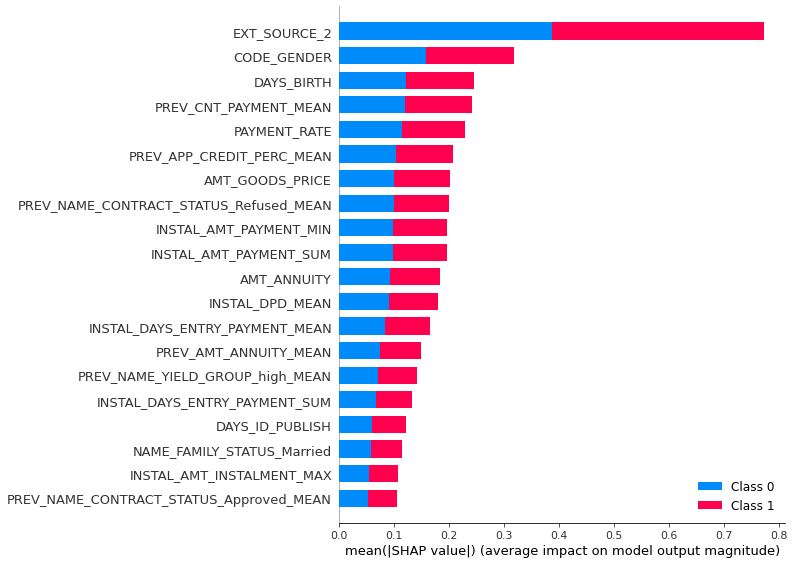

In [180]:
# background used in the plot, the points that are visible on the plot
shap.summary_plot(shap_values, background, feature_names = background.columns)

In [182]:
import plotly.io as pio
pio.templates.default = "plotly_white"
from plotly.subplots import make_subplots
import pandas as pd
import plotly.express as px

import matplotlib.pylab as pl
import numpy as np



def dependence_plot_classes(feature_name,X_background_display, y_background, shap_values) :
    """
    Create a plot showing relationship between a feature and the shapley values for this feature, colored by the class value.
        Parameters
        ----------
        feature_name : str or int
            Indicate name of the column or the index
        X_background_display : pandas.DataFrame 
            Data frame of feature values (# samples x # features) with non tranformed features values of preference
        y_background : list or np.array
            the classes - can be real or predicted
            
        shap_values : np.array
            shapley values matrx
            
    """
    if isinstance(feature_name, str):
        i = X_background_display.columns.get_loc(feature_name)
    else : 
        i = feature_name
    assert(i not in X_background_display.columns), "Column name not in data frame columns"
    
    a = shap_values[:,i]
    b = X_background_display.iloc[:,i].values
    res = y_background.astype(int).astype(str)

    assert len(a) == len(b)
    y_name = "Shapley values for "+ X_background_display.columns[i]
    x_name = X_background_display.columns[i]
    df = pd.DataFrame({y_name:a,x_name:b,"y_label": res})
    fig = px.scatter(df,  x=x_name, y=y_name, color="y_label", marginal_y="histogram", marginal_x="histogram",width=500, height=500,opacity=0.5)

    fig.show()

In [ ]:
dependence_plot_classes(feature_name,X_background_display, y_background, shap_values)

In [104]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[1744,  748],
       [ 824, 1548]])

In [76]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[2297,  700],
       [ 974, 1393]])

In [46]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[3324,  666],
       [1228, 1146]])

# Results Undersampling df Version Thresh 0.5 
Best  -0.655 params {'learning_rate': 0.0690711273391379, 'max_depth': 8.0, 'min_child_weight': 25.0, 'min_data_in_leaf': 14.0, 'min_split_gain': 0.24462483497006832, 'num_leaves': 34.0, 'reg_alpha': 0.06897477282989405, 'reg_lambda': 0.028628472180409287, 'subsample': 0.9984636029180414}


In [238]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[1622,  731],
       [ 750, 1626]])

In [240]:
tn, fp, fn, tp = confusion_matrix(valid_y, valid_preds).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

0.6535774410774411

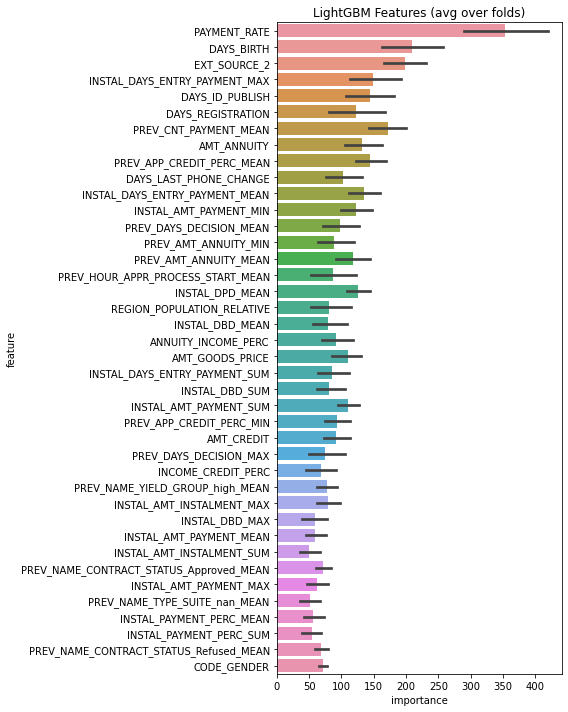

In [241]:
display_importances(feature_importance_df)

In [263]:
# for now y_pred is the probability that the value is 1
my_valids = [1 if i >= 0.44 else 0 for i in valid_preds_proba[:,1]]
    
my_valids = pd.Series(my_valids)

confusion_matrix(valid_y, my_valids)

array([[1395,  958],
       [ 570, 1806]])

In [264]:
tn, fp, fn, tp = confusion_matrix(valid_y, my_valids).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

0.7197811447811447

In [274]:
import shap
shap.initjs()

shap_explainer = shap.TreeExplainer(model)
shap_values = shap_explainer.shap_values(train_df[feats])
#len(shap_values)
shap.force_plot(shap_explainer.expected_value, shap_values[1, :], test_1)

TypeError: list indices must be integers or slices, not tuple

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


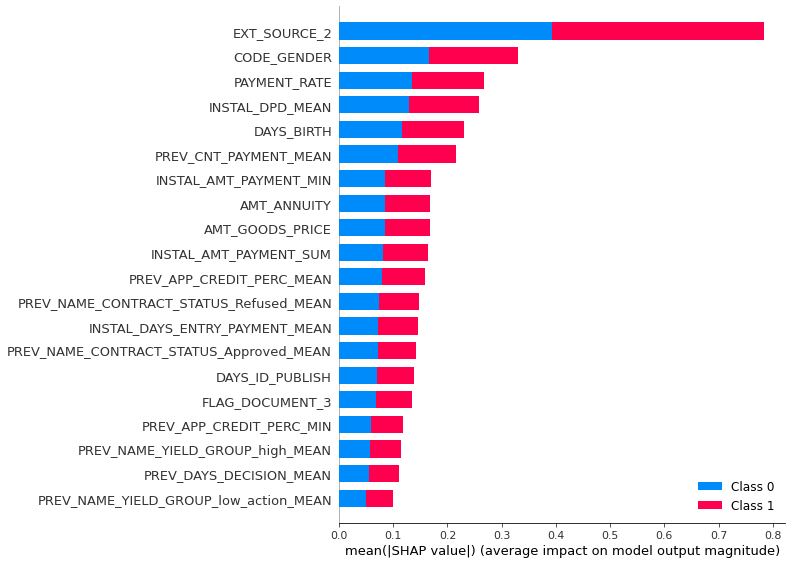

In [265]:
import shap
shap_values = shap.TreeExplainer(model).shap_values(train_x)
shap.summary_plot(shap_values, train_x, plot_type="bar")

In [267]:
test_1 = valid_x.iloc[1]

In [268]:
import lime 
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data =np.array(train_x),
    feature_names = train_x.columns,
    class_names=['bad', 'good'],
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row = test_1,
    predict_fn=model.predict_proba
)
lime_exp.show_in_notebook(show_table=True)


In [269]:
lime_exp.predict_proba

array([0.70899721, 0.29100279])

# Results No Missing Values df Version Thresh 0.5 
Scoring with new weights


In [165]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[26305,   127],
       [ 2312,    84]])

In [169]:
tn, fp, fn, tp = confusion_matrix(valid_y, valid_y).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

1.0

# Results No Missing df Version Thresh 0.5 
Best  -0.056 params {'learning_rate': 0.9984658441853237, 'max_depth': 7.0, 'min_data_in_leaf': 5.0, 'min_split_gain': 0.14359362198531114, 'num_leaves': 37.0, 'reg_alpha': 0.03057280931587678, 'reg_lambda': 0.18296876279006813, 'subsample': 0.18971990503932706}

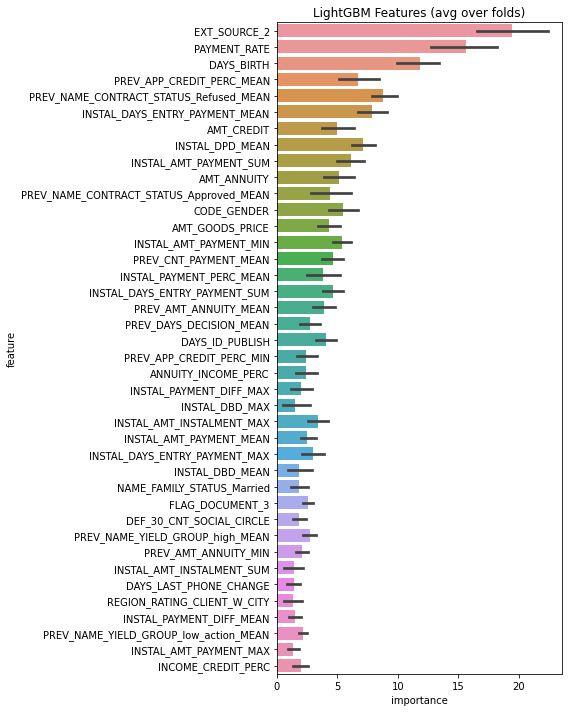

In [133]:
display_importances(feature_importance_df)

In [134]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[26250,   182],
       [ 2300,    96]])

In [138]:
tn, fp, fn, tp = confusion_matrix(valid_y, valid_preds).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

0.03247078464106845

In [135]:
# for now y_pred is the probability that the value is 1
my_valids = [1 if i >= 0.4 else 0 for i in valid_preds_proba[:,1]]
    
my_valids = pd.Series(my_valids)

confusion_matrix(valid_y, my_valids)

array([[26039,   393],
       [ 2225,   171]])

In [136]:
tn, fp, fn, tp = confusion_matrix(valid_y, my_valids).ravel()

tn_weight = 1
fp_weight = 0
fn_weight = -10
tp_weight = 0
# gain function for company, true positives and false positives don't matter that much to us
# we want to penalise the false negatives, and we want to say yes to true negatives
gain = tp*(tp_weight) + tn*(tn_weight) + fp*(fp_weight) + fn*(fn_weight)

# best represents scenario where there are no false negatives or false postives
# so all false positives would be correctly shown as negative
# and all false negatives would be correctly show as positive
best = (tn + fp) * tn_weight + (tp + fn) * tp_weight

# baseline is a naive model that predicts non default(negative) for everyone
# but all true positives and false negatives would be incorrectly shown as negative
baseline = (tn + fp) * tn_weight + (tp + fn) * fn_weight

score = (gain - baseline) / (best - baseline)

score

0.05496661101836394

# Results SMOTE df Version Thresh 0.5 
Best  -0.913 params {'learning_rate': 0.5379983216330518, 'max_depth': 8.0, 'min_data_in_leaf': 10.0, 'min_split_gain': 0.5111350465018228, 'num_leaves': 36.0, 'reg_alpha': 0.022166934271907825, 'reg_lambda': 0.09803381099417433, 'subsample': 0.08879622311479493}

In [109]:
feature_importance_df

,feature,importance,fold
0,INSTAL_AMT_INSTALMENT_MAX,16,1
1,PREV_NAME_YIELD_GROUP_high_MEAN,105,1
2,PREV_APP_CREDIT_PERC_MIN,59,1
3,PREV_NAME_CONTRACT_STATUS_Refused_MEAN,66,1
4,PREV_DAYS_DECISION_MEAN,39,1
...,...,...,...
47,PREV_NAME_YIELD_GROUP_low_action_MEAN,42,10
48,FLAG_DOCUMENT_3,13,10
49,NAME_FAMILY_STATUS_Married,7,10
50,REGION_RATING_CLIENT_W_CITY,17,10


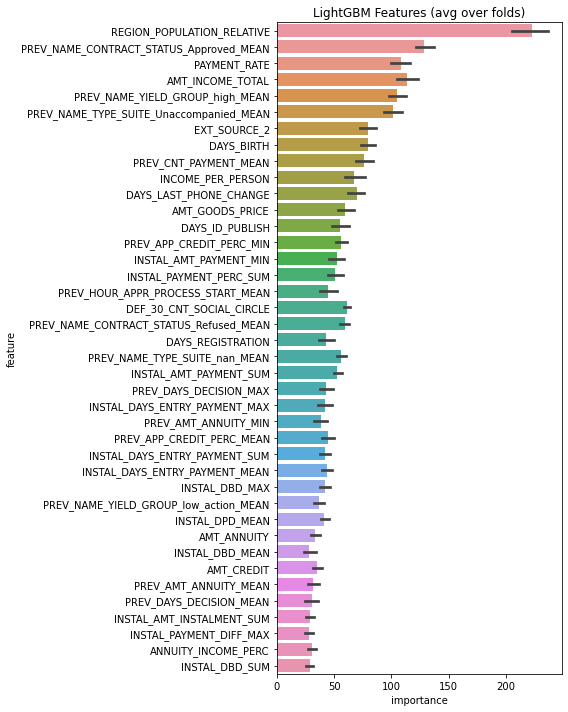

In [110]:
display_importances(feature_importance_df)

In [111]:
from sklearn.metrics import confusion_matrix
conf_lgm = confusion_matrix(valid_y, valid_preds)
conf_lgm

array([[27734,   525],
       [ 2379, 25895]])

In [115]:
# for now y_pred is the probability that the value is 1
my_valids = [1 if i >= 0.4 else 0 for i in valid_preds_proba[:,1]]
    
my_valids = pd.Series(my_valids)

confusion_matrix(valid_y, my_valids)

array([[27329,   930],
       [ 2196, 26078]])